 <center> <h1> <b> Pattern Recognition and Machine Learning (EE2802 - AI2000) </b> </h1> </center>

<b> Programming Assignment 02 - Regression : </b> Welcome to the programming assignment (PA) on regression. This programing assignment focuses on understanding the basic concepts of linear regression.


<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions are not accepted
3. Please DO NOT use any machine learning libraries unless and otherwise specified.


<center> <h2> <b> Understanding Basic Concepts </b> </h2> </center>


<b> Part - (1) :  Understanding Error Surfaces </b>

According to www.geogebra.org, the relationship between human height (in
inches) and weight (in pounds) is given by <br>
<center> $t = 3.86x - 110.42$ </center>

(a) Generate 25 meaningful data points from this relationship, mimicking a
noisy sensor, where the noise follows a zero mean Gaussian with a variance
of 20. Plot the scatter plot of the data. <br>
(b) Now, we need to estimate the above relationship from the noisy data
generated in (a) by fitting a line, i.e $\hat{t} = y(x,\textbf{w}) = w_{0} + w_{1}x$. Let us use least squares criterion discussed in the class to estimate the parameters $w_{0}$ and $w_{1}$. Generate and plot the error surface $J(w_{0},w_{1})$ associated with this approach. Locate the minimum on this error surface.<br>

(c) Estimate the parameters using least squares approach, and compare them
with the desired values.
<center> $\textbf{w}_{opt} = (\textbf{X}^{T}\textbf{X})^{-1}\textbf{X}^{T}\textbf{t}$</center>

(d) Report all your observations

<b> Part - (2) : Understanding model order and overfitting  </b>

(a). Generate  20  data  points  from $t_{n} = sin(2πx_{n}) + e_{n}$, where $x_{n} \in [0,1] $ and $e_{n} \thicksim \mathcal{N} (0,0.1)$ , and divide them into two sets, a training set and a testing set, with each set containing 10 points <br>

(b). Fit  an $M^{th}$ degree  polynomial  to  the  training  data  using  least  squares approach, i.e.,
<center> $\hat{t_{n}} = w_{0} + w_{1}x + .... +  w_{m}x^{m} + ... + w_{M}x^{M} $ </center>

Use the estimated parameter vector $\textbf{w}$, to predict the target values in training and testing datasets.  Plot the root mean squared error associated with each dataset, for M=0,1,...,9. Explain your results. <br>

(c) Increase the size of the training dataset to 100 points, and repeat (b). <br>

(d) Add a $l_{2}$ regularization term to the objective function in (b) and repeat (b) and (c).  Study the affect of Lagrange multiplier λ on the root mean squared error of the training and testing datasets <br>

(e) Modify the function in (a) to $t_{n}=5+sin(2πx_{n})+e_{n}$ to study the effect of regularizing the bias coefficient $w_{0}$.

(f) Report all your observations

<b> Part - (3) : Understanding the choice of kernel  </b>


(a). Generate 100 data points from $t_{n}=sin(2πx_{n})+e_{n}$, where $x_{n} \in [0,1]$ and $e_{n} \thicksim \mathcal{N}(0,0.1)$, and divide them into two sets, a training set and a testing test each containing 50 points.  Fit an $M^{th}$ degree polynomial using polynomial,Gaussian and sigmoidal kernels, and study the goodness of fit in each case, for different model orders M

(b). Repeat (a) by modifying the target function to <br>
$$t_{n} = \begin{cases}
 \text{sinusoid} + e_{n} , \;\; where \;\; x  \in [0,1) \\
 \text{triangle} + e_{n} , \;\; where \;\; x  \in [1,2) \\
 \text{Gaussian} + e_{n} , \;\; where \;\; x  \in [2,3) \\
\end{cases}$$

Clearly discuss your observations/results for each of the three kernels.

(c). Report all your observations

<b> Part - (4) : Understanding online training  </b>

(a). Repeat 3(a) and 3(b) using stochastic gradient descent for weight update.Study the effect of step size $\eta$ convergence of the weights, and compare them to those obtained using closed form expressions in 3.  Plot the mse as a  function  of  iterations.

(b). Study the effect of batch size on the speed of convergence

(c). Report all your observations

<b> Part - (5) : Understanding bias-variance trade-off  </b>

(a). Generate L=100 datasets of noisy sinusoidal data, each having N=25  datapoints. For each dataset, fit a $M=25^{th}$ order linear regression model consisting of 24 Gaussian basis functions and one bias parameter.  Use regularized least squares, governed by the parameter λ, to estimate the parameters $\textbf{w}$. Illustrate the concept of bias and variance using these 100 different parameter fits.
1.   Chose three different regularization coefficeints (low,middle and high)
2. For every regularization coefficient, produce two plots: one displaying 100 estimated curves, and the other showing the mean of the estimated curves alongside the original function.
2. For three regularization coefficients, you should have a total of six plots, meaning two plots for each regularization.
3. Using the six plots above, describe the bias-variance trade-off.


(b). Report all your observations







<b> Part - (6) : Understanding
Maximum a Posteriori (MAP) estimate  </b>

(a). Generate 100 noisy data points of a sinusoid. Fit a $20^{th}$  order  linear regression  model  with  Gaussian  basis  functions. Starting from a standard normal prior, update the statistics of the posterior density of the parameters using Bayesian sequential updates.

(b). Sample a parameter vector from the posterior distribution, and obtain the curve fit for this realization. Repeat this for several times, and estimate the average of these curve fits, and compare it with the original sinusoid

(c). Use the posterior distribution of the parameters to evaluate the predictive distribution of target $p(t_{0}/x_{0},X,t)$, and plot it for different number of training data points, as discussed in the class.

(d). Report all your observations

In [1]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections


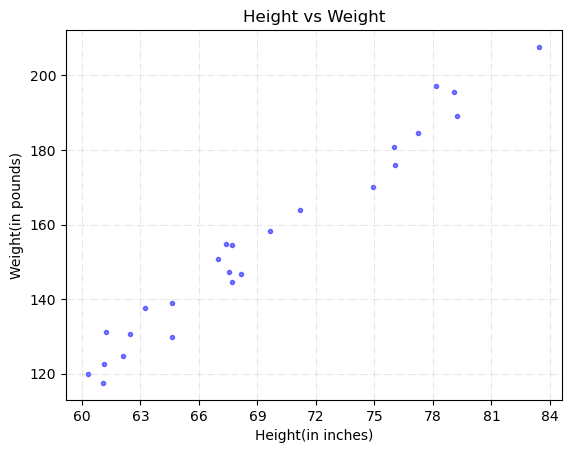

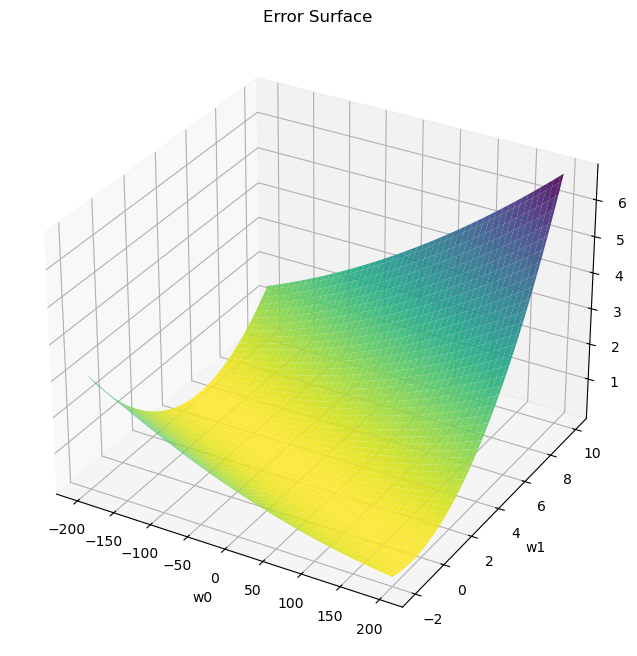



(from Error Surface) Minimum error at : w0 = -111.111111111, w1 = 3.818181818




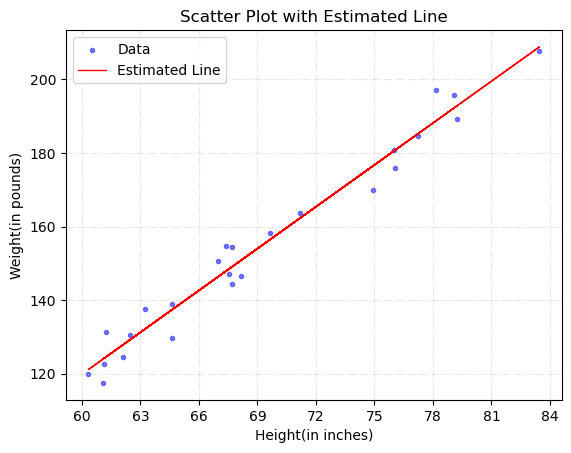



(from Least Squares) Optimal weights : w0 = -107.628622389, w1 = 3.791704148
(from Error Surface) Minimum error at : w0 = -111.111111111, w1 = 3.818181818



In [2]:
#Understanding Error Surface
########################################
#Generate meaningfull data
########################################

population_points = 100000  #number of population points = design choice
num_points = 25
x = np.linspace(60, 84, population_points)  # Human height (inches) - Reasonable range of 60in(5ft) - 84in(7ft)
x = np.random.choice(x, size=num_points, replace = False)  #choice of 25 points of sample from the population
noise = np.random.normal(0, np.sqrt(20), num_points) # Gaussian noise
t = 3.86 * x - 110.42 + noise  # Human weight (pounds)(t) with noise (a Gaussian)



########################################
#Plot scatter plot of data
########################################

plt.scatter(x, t, color = 'blue', marker = ".", alpha = 0.5)
plt.xlabel('Height(in inches)')
plt.ylabel('Weight(in pounds)')
plt.title('Height vs Weight')
plt.xticks(range(60,85,3))
plt.grid(axis = 'both', linestyle = "-.", alpha = 0.3)
plt.show()


########################################
#Weight estimation through error surface, i.e., empirically locate the minima of error surface
########################################
#Sample a bunch of w's around w_opt and compute the associated error

"""W0_values, W1_values range has been assumed and fixed
at random by observing the value of w_opt from linear regression"""
w0_values = np.linspace(-200, 200, 100)
w1_values = np.linspace(-2, 10, 100)
W0, W1 = np.meshgrid(w0_values, w1_values)
Error_Surface = np.zeros(W0.shape)


#Compute the error
def Error(w,t,x): #inputs : 1)weight 2)data i.e (t,x)
    #Estimate the target
    t_pred = w[0] + w[1] * x
    #Compute and return the error
    # squared error
    error = np.sum((t - t_pred)**2)  #(or) np.linalg.norm(t - t_pred))**2
    return (error/2)


#Plot 3D error surface and the corresponding contour plots
#Error surface is a function of w0 and w1
for i in range(W0.shape[0]):
  for j in range(W0.shape[1]):
    Error_Surface[i, j] = Error([W0[i, j],W1[i, j]], t, x)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(W0, W1, Error_Surface, cmap = 'viridis_r', alpha = 0.9)
#ax.contour(W0, W1, Error_Surface)
ax.set_xlabel('w0')
ax.set_ylabel('w1')
ax.set_zlabel('Error')

ax.set_title('Error Surface')


#Locate the minima of the error surface
min_index = np.unravel_index(np.argmin(Error_Surface), Error_Surface.shape)
min_w0 = W0[min_index]
min_w1 = W1[min_index]
"""
ax.scatter(min_w0, min_w1, Error_Surface[min_index[0], min_index[1]], color = "blue", alpha=1, marker = "o" )
ax.text(min_w0, min_w1,Error_Surface[min_index[0], min_index[1]], "Minima Here")
"""
plt.show()
print(f"\n\n(from Error Surface) Minimum error at : w0 = {min_w0:.9f}, w1 = {min_w1:.9f}\n\n")


"""plt.contour(W0, W1, Error_Surface, cmap = 'viridis_r')
plt.show()"""

########################################
#Least squares approach to estimate the weights
########################################
#Complete the below linear regression function
def LinearRegression(x,t): #inputs : 1)input data i.e (x). 2)target i.e (t)
    X = np.vstack([np.ones(len(x)), x]).T # X matrix as discussed in class
    w_opt = np.linalg.solve(X.T @ X, X.T @ t) #solves for x in Ax=b, here 1st arg=A, 2nd arg = b
    return w_opt


#Estimate optimal weight's using "LinearRegression" function
w_opt = LinearRegression(x,t)

#Estimate the targets using the input x and the estimated weights
t_pred = w_opt[0] + w_opt[1] * x

#Plot the estimated line on top of the above scatter plot
plt.scatter(x, t, color = 'blue', label='Data', marker = '.', alpha = 0.5)
plt.plot(x, t_pred, color='red', label='Estimated Line', linewidth = 1)
plt.xlabel('Height(in inches)')
plt.ylabel('Weight(in pounds)')
plt.title('Scatter Plot with Estimated Line')
plt.grid(axis = 'both', linestyle = "-.", alpha = 0.3)
plt.xticks(range(60,85,3))
plt.legend()
plt.show()


########################################
#Compare the estimated weight's using least squares approach with the error surface approach
########################################

print(f"\n\n(from Least Squares) Optimal weights : w0 = {w_opt[0]:.9f}, w1 = {w_opt[1]:.9f}")
print(f"(from Error Surface) Minimum error at : w0 = {min_w0:.9f}, w1 = {min_w1:.9f}\n")


**Report your observations**

1. From multiple runs of the code, it's evident that the value of $(\textbf{w}_{opt})_1$ (coefficient of $x$) is predicted almost correctly by linear regression, but there is a slight deviation of values of $(\textbf{w}_{opt})_0$ from that of he error surface and from that of the linear regression. the difference is not too high, but reasonable because of the noice added in tthe data due to gaussian here.

2. the error surface is steeper in one direction and not so steep in other direction.

3. the contours of error surface when plotted, gave straight lines.




Ploting training and testing estimates alogwith the original targets
for dataset length= 20 points
for lamda(λ)=0




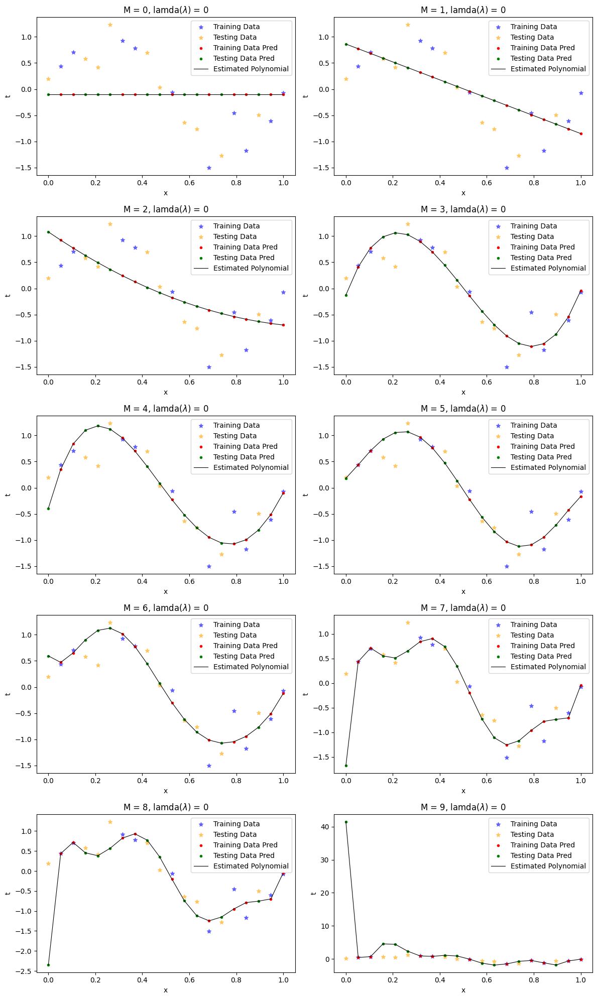

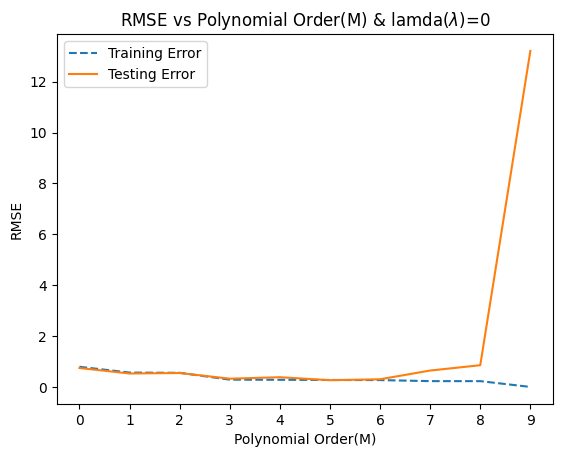


Ploting training and testing estimates alogwith the original targets
for dataset length= 100 points
for lamda(λ)=0




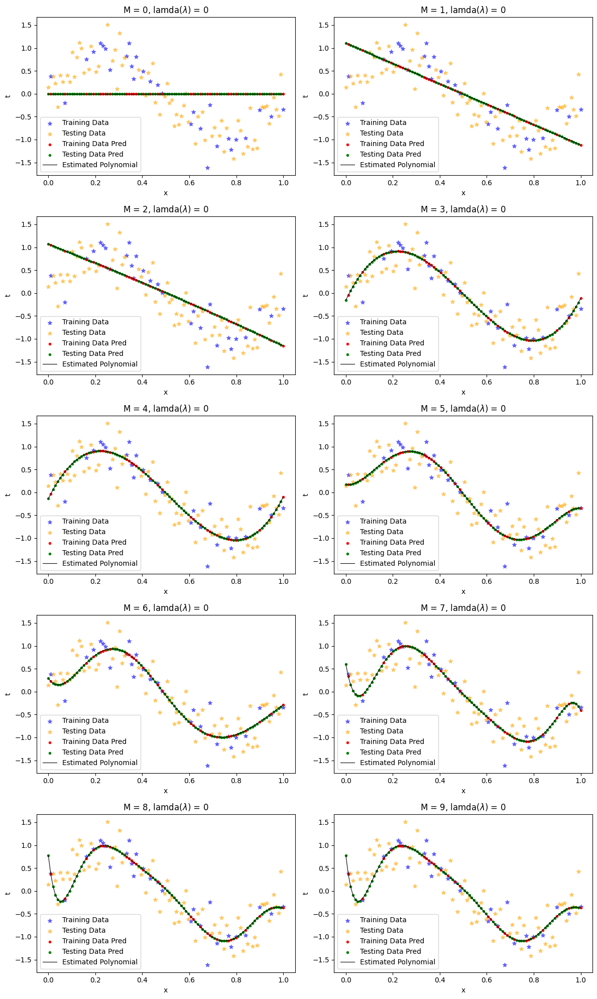

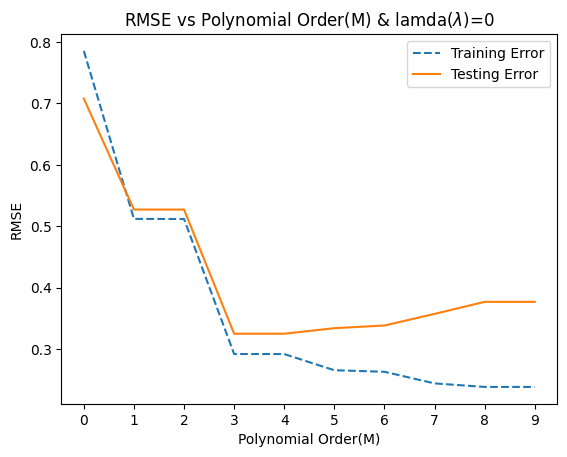


Ploting training and testing estimates alogwith the original targets
for dataset length= 100 points
for lamda(λ)=0




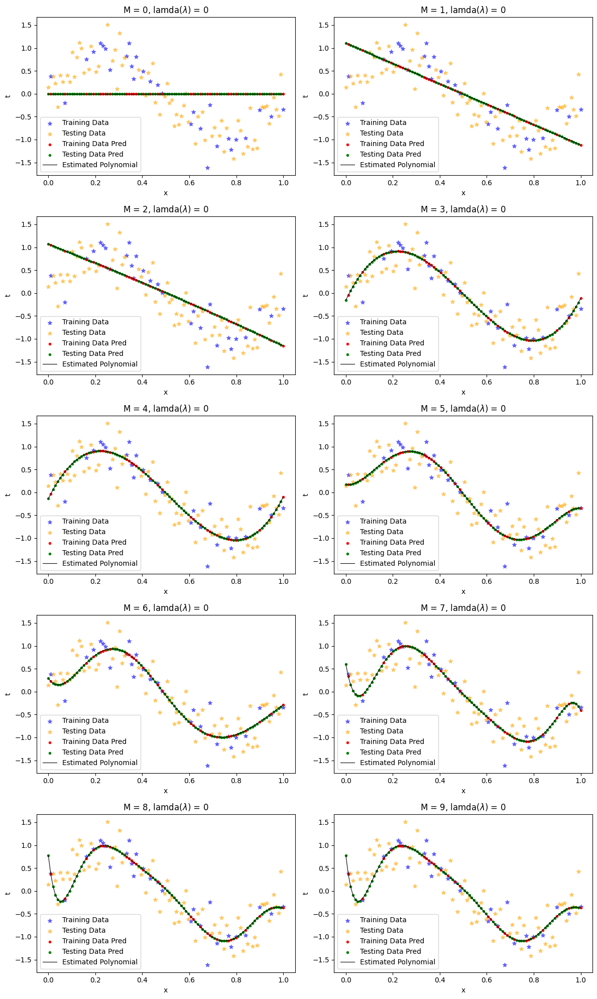

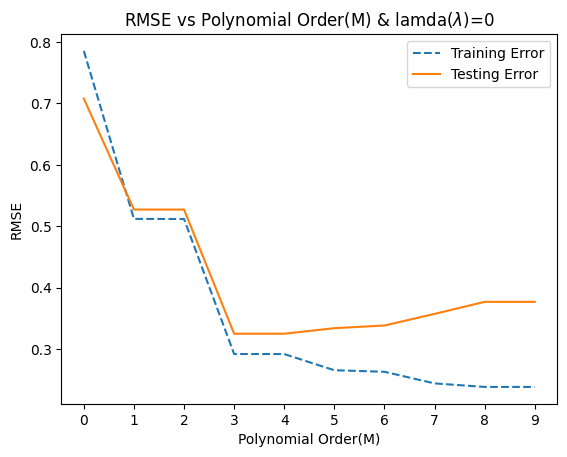


Ploting training and testing estimates alogwith the original targets
for dataset length= 100 points
for lamda(λ)=1e-07




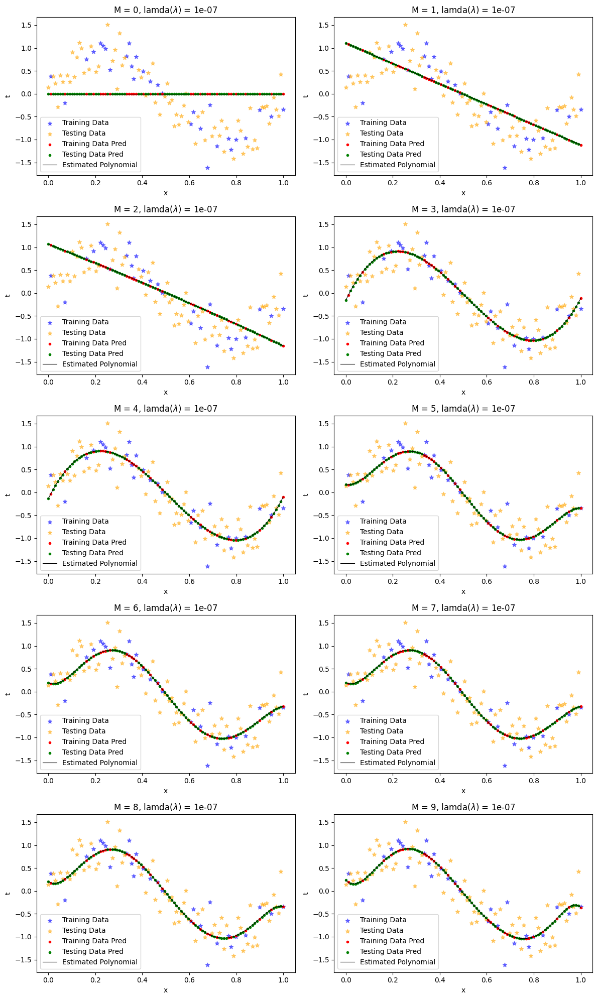

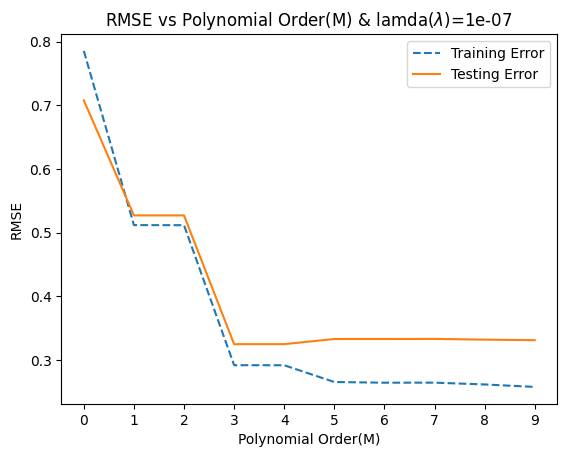


Ploting training and testing estimates alogwith the original targets
for dataset length= 100 points
for lamda(λ)=0.0001




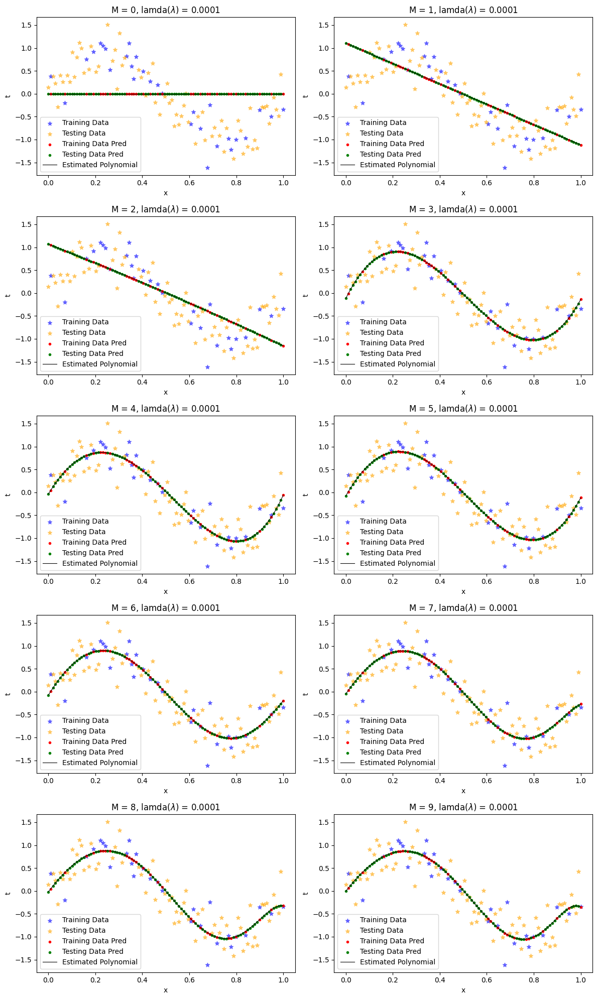

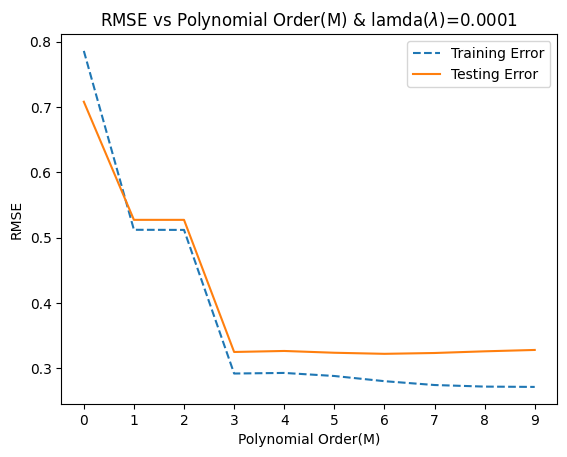


Ploting training and testing estimates alogwith the original targets
for dataset length= 100 points
for lamda(λ)=0.01




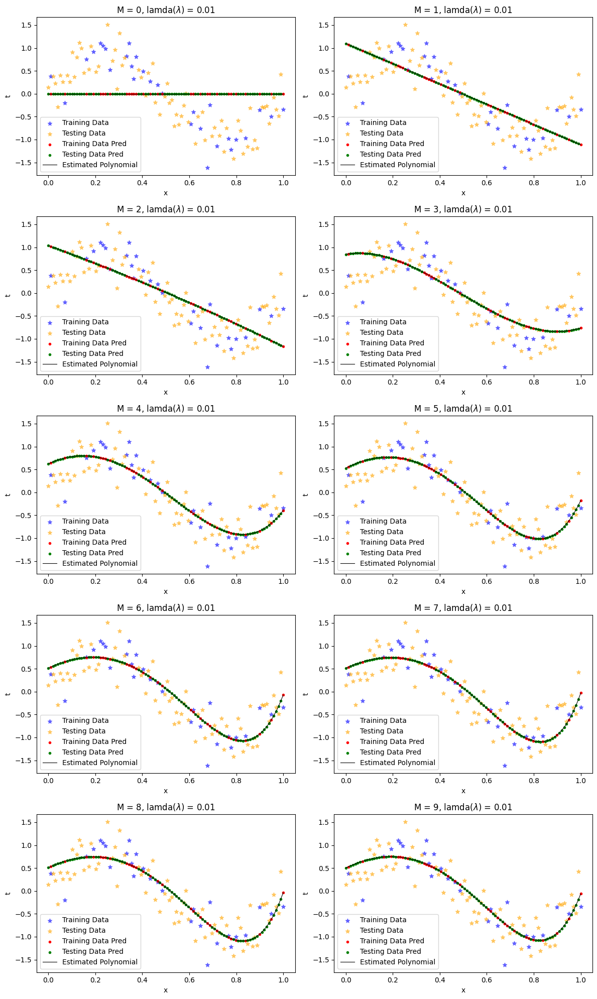

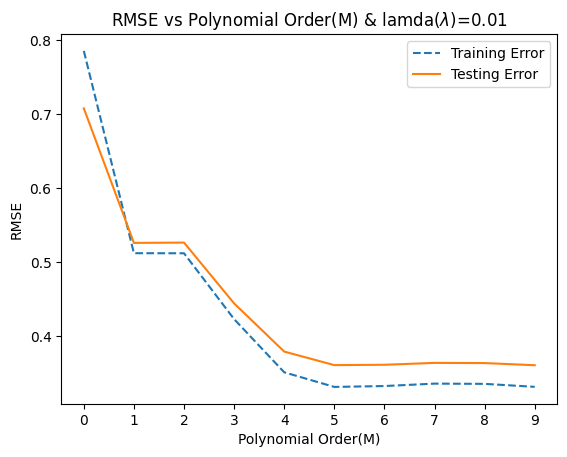


Ploting training and testing estimates alogwith the original targets
for dataset length= 100 points
for lamda(λ)=1




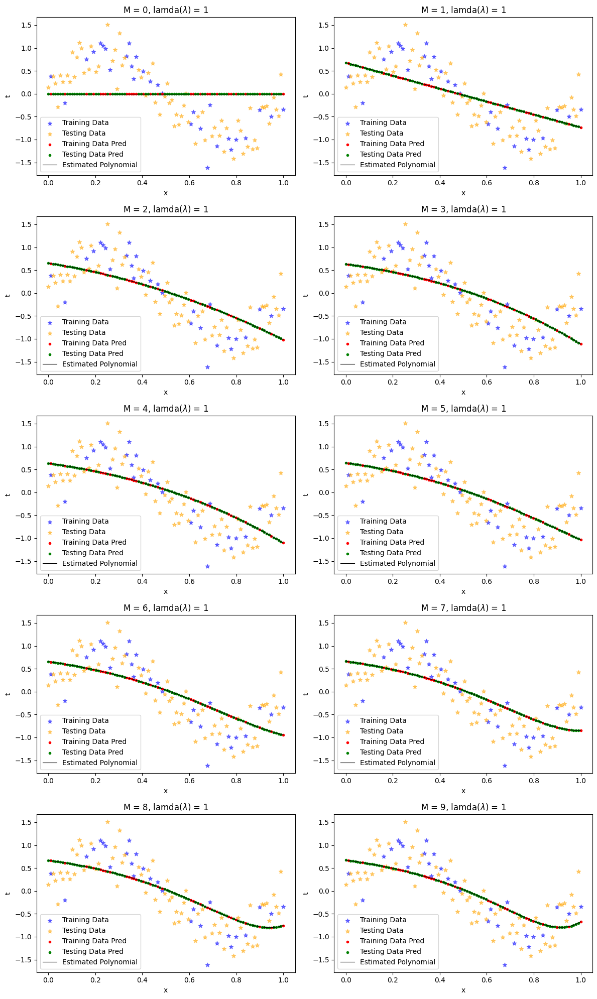

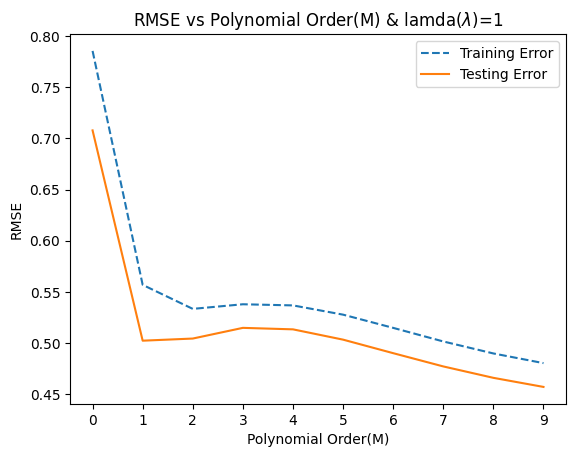

for M= 7, Weights without regularization:
 [ 5.38624947e+00 -2.73826604e+01  9.02541048e+02 -9.25701307e+03
  4.67052960e+04 -1.32631259e+05  2.21711751e+05 -2.16346862e+05
  1.14025608e+05 -2.50832860e+04]
for M= 7, Weights with regularization lamda(λ)=0.001:
 [  5.42794956   5.05823496 -11.47123761  -4.68974467   2.89084494
   6.45750591   6.16886885   3.19041708  -1.38109922  -6.7500589 ]


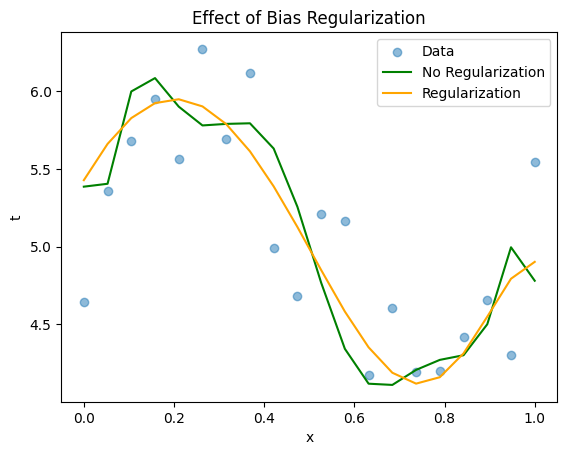

In [3]:
#Understanding model order and overfitting
########################################
#Generate 20 data points
########################################

num_points = 20
x_sort_20 = np.linspace(0, 1, num_points)
x_unsort_20 = np.random.choice(x_sort_20, size=num_points, replace = False)
noise_20 = np.random.normal(0, np.sqrt(0.1), num_points)
t = np.sin(2 * np.pi * x_unsort_20) + noise_20

#Obtain train and test splits
X_train = x_unsort_20[:10]
Y_train = t[:10]
X_test = x_unsort_20[10:]
Y_test = t[10:]


########################################
#Fitting Mth degree polynomial using least squares approach
########################################
#Complete the function
def PolynomialFit(X_train,Y_train,M,lamda): #(training data, training targets, Model order, Regularization coefficient)
    #Transform the data using polynomial kernel

    # M+1 dimentional space, Fits an Mth degree polynomial using least squares.
    X = np.vander(X_train, M + 1, increasing=True) #"true" => degree of polynomial increases from left to right, false =>otherwise

    #Find Pseudo inverse solution
    w_opt = np.linalg.solve(X.T @ X + lamda * np.eye(M + 1), X.T @ Y_train)   #np.eye(M+1) = np.identity(M+1)

    #return the weight vector
    return w_opt

#Complete the function
def PolynomialPred(w_est,X_train,X_test): #(weight,training data, testing data, training targets, testing targets)
    #Estimate the targets for both training and testing data

    Y_train_pred = np.polyval(w_est[::-1], X_train) #reversing the weightvector direction for polynomial evaluation
    Y_test_pred = np.polyval(w_est[::-1], X_test)

    #Return training and testing predictions
    return Y_train_pred, Y_test_pred

#Complete the function
def PolynomialPred_Error(w_est,X_train,X_test,Y_train,Y_test): #(weight,training data, testing data, training targets, testing targets)
    #Estimate the targets for both training and testing data

    #Predicts targets and calculates RMSE for train & test sets.
    Y_train_pred, Y_test_pred = PolynomialPred(w_est, X_train, X_test)

    TrainError = np.sqrt(np.mean((Y_train - Y_train_pred)**2))
    TestError = np.sqrt(np.mean((Y_test - Y_test_pred)**2))

    #Return training and testing error
    return TrainError,TestError   #RMSE

def part_b(M_range, x_sort, X_train, Y_train, X_test, Y_test, lamda):
    #A function for task in part b
    print("\nPloting training and testing estimates alogwith the original targets")
    print(f"for dataset length= {len(X_train)+len(X_test)} points\nfor lamda(λ)={lamda}\n\n")

    TrError = []
    TeError = []
    fig , axes = plt.subplots(len(M_range)//2, 2, figsize = (12, 2*len(M_range)))
    for i, M in enumerate(M_range):
      #Fit Mth order polynomial i.e estimate optimal w. Use the function "PolynomialFit"
      w_opt = PolynomialFit(X_train, Y_train, M, lamda)

      #Predict training and testing targets
      Y_train_pred, Y_test_pred = PolynomialPred(w_opt, X_train, X_test)

      #Predict errors on both training and testing data using estimated w. Use the function "PolynomialPred_Error"
      train_error, test_error = PolynomialPred_Error(w_opt, X_train, X_test, Y_train, Y_test)

      #Store them for plotting
      TrError.append(train_error)
      TeError.append(test_error)
      axes[i//2][i%2].set_xlabel('x')
      axes[i//2][i%2].set_ylabel('t')
      axes[i//2][i%2].set_title(f'M = {M}, lamda($\lambda$) = {lamda}')
      axes[i//2][i%2].scatter(X_train, Y_train, label='Training Data', marker ='*', color = 'blue', alpha = 0.5)
      axes[i//2][i%2].scatter(X_test, Y_test, label='Testing Data', marker ='*', color = 'orange', alpha = 0.5)
      axes[i//2][i%2].scatter(X_train, Y_train_pred, label='Training Data Pred', marker ='.', color = 'red')
      axes[i//2][i%2].scatter(X_test, Y_test_pred, label='Testing Data Pred', marker ='.', color = 'green')
      axes[i//2][i%2].plot(x_sort, np.polyval(w_opt[::-1], x_sort), label='Estimated Polynomial', linewidth=0.8, color = 'black')
      axes[i//2][i%2].legend()


    #Plot training and testing estimates alogwith the original targets
    plt.tight_layout()
    plt.show()


    #Plot training error vs polynomial order, and testing error vs polynomial order
    plt.plot(M_range, TrError, label='Training Error', linestyle="--")
    plt.plot(M_range, TeError, label='Testing Error')
    plt.xlabel('Polynomial Order(M)')
    plt.xticks(M_range)
    plt.ylabel('RMSE')
    plt.legend()
    plt.title(f'RMSE vs Polynomial Order(M) & lamda($\lambda$)={lamda}')
    plt.show()

#part b accomplished here
#Iterate through range of M values
M_range=list(range(10))
part_b(M_range, x_sort_20, X_train, Y_train, X_test, Y_test, 0) #lamda = 0


########################################
#Increase the size of training data set to 100 points and repeat the experiments
########################################

num_points_new = 100
x_sort_100 = np.linspace(0, 1, num_points_new)
x_unsort_100 = np.random.choice(x_sort_100, size=num_points_new, replace = False)
noise_100 = np.random.normal(0, np.sqrt(0.1), num_points_new)
t = np.sin(2 * np.pi * x_unsort_100) + noise_100

#dataset spit of 30 - 70
num_train_points = 30
X_train_new = x_unsort_100[:num_train_points]
Y_train_new = t[:num_train_points]
X_test_new = x_unsort_100[num_train_points:]
Y_test_new = t[num_train_points:]

part_b(M_range, x_sort_100, X_train_new, Y_train_new, X_test_new, Y_test_new, 0)  #lamda = 0



########################################
#Effect of regularization
########################################
#Consider a set of lambda's. For example: lamdas = [0, 1e-7 , 1e-4, 1e-2, 1]
lamdas = [0, 1e-7, 1e-4, 1e-2, 1]

# Create a figure to hold the plots
#fig, axes = plt.subplots(len(lamdas), 1, figsize=(6, 3 * len(lamdas)))

for lamda in lamdas:  #gives index of name at i
    # Repeat the experiments, i.e., plot the prediction and error in predictions with respect to model order.  Contrast these results with those obtained without regularization.
    part_b(M_range,x_sort_100, X_train_new, Y_train_new, X_test_new, Y_test_new, lamda)



########################################
#Effect of bias regularization
########################################
#Modify the function i.e include bias
#Generate data
num_points = 20
x_sort = np.linspace(0, 1, num_points)
x_unsort = np.random.choice(x_sort, size=num_points, replace = False)
noise_20 = np.random.normal(0, np.sqrt(0.1), num_points)
t_sort = 5 + np.sin(2 * np.pi * x_sort) + noise_20 # bias term "5"
t_unsort = 5 + np.sin(2 * np.pi * x_unsort) + noise_20  # bias term "5"

X_train_bias = x_unsort[:50]
Y_train_bias = t_unsort[:50]
X_test_bias = x_unsort[50:]
Y_test_bias = t_unsort[50:]


#Estimate the polynomial with and without regularization constraint
M = 7
lamda = 0.001
# Without regularization
w_opt_no_reg = PolynomialFit(X_train_bias, Y_train_bias, M_range[-1], 0)

# With regularization
w_opt_reg = PolynomialFit(X_train_bias, Y_train_bias, M_range[-1], lamda)  #lamda =1 , just an example

#Compare the two estimated polynomials and report the observations
print(f"for M= {M}, Weights without regularization:\n", w_opt_no_reg)
print(f"for M= {M}, Weights with regularization lamda(λ)={lamda}:\n", w_opt_reg)

# Ploting estimated polynomials with and without regularization
plt.scatter(x_sort, t_sort, label='Data', alpha = 0.5)
plt.plot(x_sort, np.polyval(w_opt_no_reg[::-1], x_sort), label='No Regularization', color = 'green')
plt.plot(x_sort, np.polyval(w_opt_reg[::-1], x_sort), label='Regularization', color = 'orange')
plt.xlabel('x')
plt.ylabel('t')
plt.legend()
plt.title('Effect of Bias Regularization')
plt.show()


**Report your observations**

1. The weights (especially the bias term,$(\textbf{w}_{opt})_0$ ) are generally smaller in magnitude with regularization.
2. The regularized polynomial is likely to be smoother and less prone to overfitting, especially if the original data had a significant bias.
3. The effect of regularization on the bias term is more pronounced when the bias is larger (as in this case with the added constant 5).



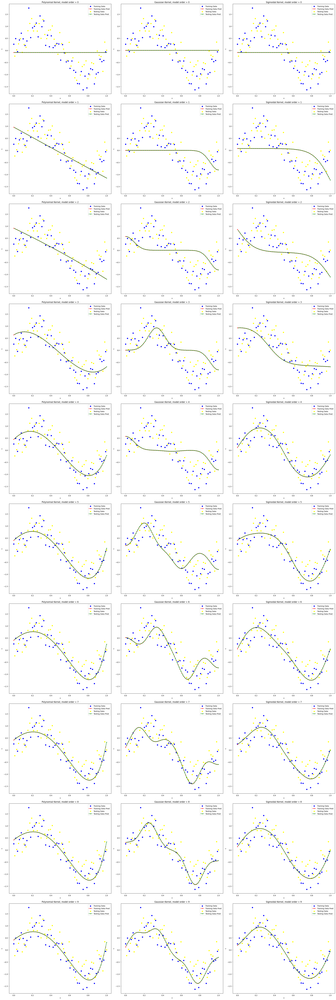

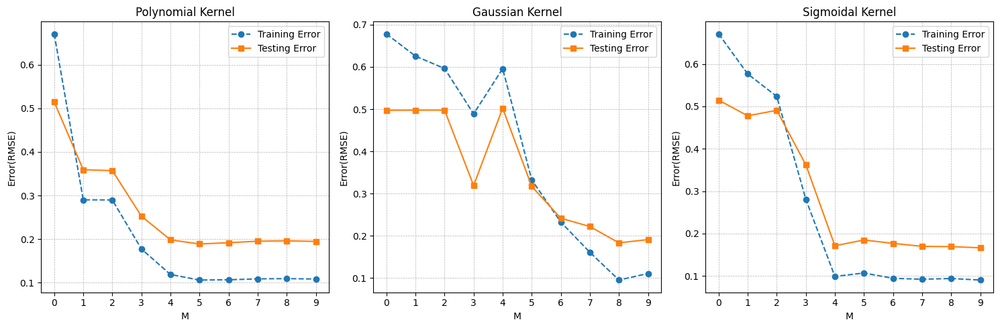

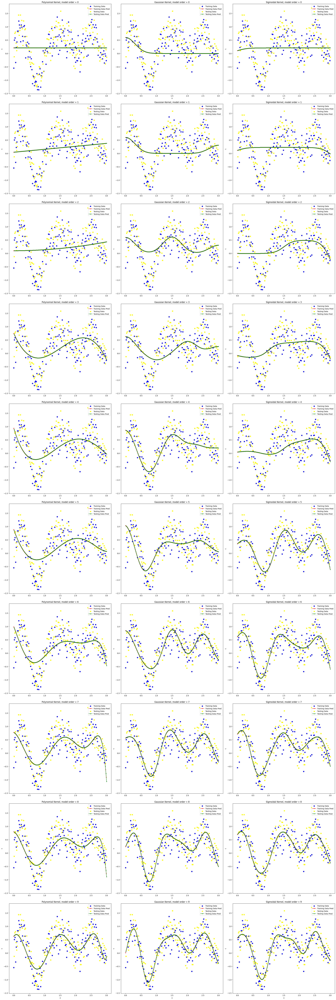

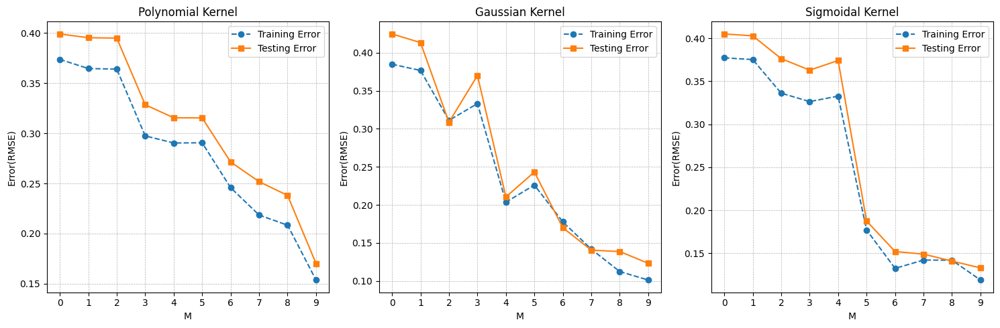

In [5]:
#Understanding the choice of kernel
########################################
#Generate 100 data points
########################################

num_points_part_a = 100
x_sort_100 = np.linspace(0, 1, num_points_part_a)
noise_100 = np.random.normal(0, np.sqrt(0.1), num_points_part_a)
t_sort_100 = np.sin(2 * np.pi * x_sort_100) + noise_100

#Obtian train and test splits
#Take even samples for training and odd samples for testing

X_train = []
Y_train = []
X_test = []
Y_test = []

for i, x_val in enumerate(x_sort_100):
  if i % 2 == 0:
    X_train.append(x_val)
    Y_train.append(t_sort_100[i])
  else:
    X_test.append(x_val)
    Y_test.append(t_sort_100[i])

def polynomial_kernel(x, M):
  P = np.vander(x, M+1, increasing=True)
  return P

def gaussian_kernel(X, sigma, means):
    N = len(X)

    #method 1 : gaussian kernel of size N x N
    """G = np.zeros((N, N))
    for i in range(N):
      for j in range(N):
            G[i, j] = np.exp(-((X[i] - X[j]) ** 2) / (2 * (sigma ** 2)))"""

    #method 2 : gaussian kernel of size N x (M+1)
    G = np.zeros((N, len(means)))
    for i in range(N):
      for j in range(len(means)):
            G[i, j] = np.exp(-((X[i] - means[j]) ** 2) / (2 * (sigma ** 2)))
    return G

def sigmoid_kernel(X, alpha, c):
    """alpha(or gamma) and c(or r) are hyperparameters for sigmoid kernel in tanh form.
        in exp form, they are means and std's of each dimentions
        --> two forms of representations => alpha, c in both forms are different,
        hence need change when computing in different forms of S matrix
    """

    N = len(X)

    #method 1 :sigmoidal kernal of size N x N
    """S = np.zeros((N, N))
    for i in range(N):
      for j in range(N):
            S[i, j] = np.tanh(alpha * X[i]*X[j] + c)"""

    #method 2 : sigmoidal kernel of size N x (M+1)
    S = np.zeros((N, len(alpha)))
    for i in range(N):
      for j in range(len(alpha)):   #two forms of representations, alpha, c in both forms are different hence need change when computing in different forms of S
            #S[i, j] =  np.tanh(alpha[j] * X[i] + c)
            S[i, j] =  1/(1 + np.exp(-(X[i]-alpha[j])/c))
    return S

#Function to estimate the parameters
def KernelRegressionFit(X_train,Y_train,kernelType,M,lamda, means, sigma): #(training data, training targets, type of kernel, regularization coefficient)
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #print(X_train.shape)
    #X_train = np.reshape(X_train, (1,-1))
    #Y_train = np.reshape(Y_train, (1,-1))
    """not reshaping the data since it is already in the correct shape, as of taught in the class"""

    X = []  #kernel transformed input matrix, phi in class
    if kernelType.casefold()=='polynomial':
      #Use polynomial kernel to transform the data
      X = polynomial_kernel(X_train, M)

    if kernelType.casefold()=='gaussian':
      #Use Gaussian kernel to transform the data
      X = gaussian_kernel(X_train, sigma, means)

    if kernelType.casefold()=='sigmoidal':
      #Use Sigmoid kernel to transform the data
      X = sigmoid_kernel(X_train, alpha = means , c =sigma)

    #Estimate weights using Pseudo iverse solution
    w_opt = np.linalg.solve(X.T @ X + lamda * np.eye(len(X.T)), X.T @ Y_train)  #here np.eye(M+1) = np.identity(M+1)

    #Return the estimated weights
    return w_opt

#Function to compute the training and testing errors from the current weight estimates
def KernelRegressionPred_Error(w_est,X_train,Y_train,X_test,Y_test,kernelType, means, sigma):
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    X_tr = []
    X_te = []
    #X_train = np.reshape(X_train, (1,-1))
    #Y_train = np.reshape(Y_train, (1,-1))
    #X_test = np.reshape(X_test, (1,-1))
    #Y_test = np.reshape(Y_test, (1,-1))
    """not reshaping the data since it is already in the correct shape, as of taught in the class"""

    M = len(w_est)-1
    if kernelType.casefold()=='polynomial':
      #Use polynomial kernel to transform the data
      X_tr = polynomial_kernel(X_train, M)
      X_te = polynomial_kernel(X_test, M)

    if kernelType.casefold()=='gaussian':
      #Use Gaussian kernel to transform the data
      X_tr = gaussian_kernel(X_train, sigma, means)
      X_te = gaussian_kernel(X_test, sigma, means)

    if kernelType.casefold()=='sigmoidal':
      #Use Sigmoid kernel to transform the data
      X_tr = sigmoid_kernel(X_train, alpha = means, c =sigma)
      X_te = sigmoid_kernel(X_test, alpha  = means, c =sigma)

    #Estimate training and testing targets
    TrainPred = X_tr @ w_est
    TestPred = X_te @ w_est

    #Compute training and testing errors
    TrainError = np.mean((TrainPred - Y_train) ** 2)
    TestError = np.mean((TestPred - Y_test) ** 2)

    #Compute and return the training and testing errors, Predicteds
    return TrainError, TestError, TrainPred, TestPred

def part_a(X_train,Y_train,X_test,Y_test):
    #Iterate through range of M values
    M_range=list(range(10))

    #Store training and testing errors for all the three kernels for each of M values
    polynomial_tr_error = []
    polynomial_te_error = []
    gaussian_tr_error = []
    gaussian_te_error = []
    sigmoid_tr_error = []
    sigmoid_te_error = []

    fig , axes = plt.subplots(len(M_range),3,figsize=(27,80))

    for i, M in enumerate(M_range):
        #Fit Mth order polynomial using three kernels i.e {Polynomial,Gaussian,Sigmoid}

        w_opt_poly = KernelRegressionFit(X_train,Y_train,'polynomial',M,0.01, means = [] , sigma =0)
        w_opt_gauss = KernelRegressionFit(X_train,Y_train,'gaussian',M,0.01, means = np.linspace(-1, 1, M+1), sigma = 0.09)
        w_opt_sigmoid = KernelRegressionFit(X_train,Y_train,'sigmoidal',M,0.01, means = np.linspace(-1, 1, M+1), sigma = 0.09)

        #Predict training and testing targets using estimated w
        #Predict errors on both training and testing data using estimated w
        TrainErrorPoly, TestErrorPoly, TrainPredPoly, TestPredPoly = KernelRegressionPred_Error(w_opt_poly,X_train,Y_train,X_test,Y_test,'polynomial', means = [], sigma = 0)
        TrainErrorGauss, TestErrorGauss, TrainPredGauss, TestPredGauss = KernelRegressionPred_Error(w_opt_gauss,X_train,Y_train,X_test,Y_test,'gaussian', means = np.linspace(-1, 1, M+1), sigma = 0.09)
        TrainErrorSigmoid, TestErrorSigmoid, TrainPredSigmoid, TestPredSigmoid = KernelRegressionPred_Error(w_opt_sigmoid,X_train,Y_train,X_test,Y_test,'sigmoidal', means = np.linspace(-1, 1, M+1), sigma = 0.09)

        #Store them for plotting
        polynomial_tr_error.append(TrainErrorPoly)
        polynomial_te_error.append(TestErrorPoly)
        gaussian_tr_error.append(TrainErrorGauss)
        gaussian_te_error.append(TestErrorGauss)
        sigmoid_tr_error.append(TrainErrorSigmoid)
        sigmoid_te_error.append(TestErrorSigmoid)

        #Plot the predicted training and testing targets alongside the original targets for various model orders and all three different kernels.
        axes[i][0].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
        axes[i][0].plot(X_train, TrainPredPoly, label='Training Data Pred', marker = '.', color ='red')
        axes[i][0].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
        axes[i][0].plot(X_test, TestPredPoly, label='Testing Data Pred', marker = '.', color ='green')
        axes[i][0].set_title(f'Polynomial Kernel, model order = {M}')
        axes[i][0].set_xlabel('x')
        axes[i][0].set_ylabel('t')
        axes[i][0].legend()

        axes[i][1].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
        axes[i][1].plot(X_train, TrainPredGauss, label='Training Data Pred', marker = '.', color ='red')
        axes[i][1].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
        axes[i][1].plot(X_test, TestPredGauss, label='Testing Data Pred', marker = '.', color ='green')
        axes[i][1].set_title(f'Gaussian Kernel, model order = {M}')
        axes[i][1].set_xlabel('x')
        axes[i][1].set_ylabel('t')
        axes[i][1].legend()

        axes[i][2].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
        axes[i][2].plot(X_train, TrainPredSigmoid, label='Training Data Pred', marker = '.', color ='red')
        axes[i][2].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
        axes[i][2].plot(X_test, TestPredSigmoid, label='Testing Data Pred', marker = '.', color ='green')
        axes[i][2].set_title(f'Sigmoidal Kernel, model order = {M}')
        axes[i][2].set_xlabel('x')
        axes[i][2].set_ylabel('t')
        axes[i][2].legend()

    plt.tight_layout()
    plt.show()

    #Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].plot(M_range, polynomial_tr_error, label='Training Error', linestyle='--', marker = 'o')
    axes[0].plot(M_range, polynomial_te_error, label='Testing Error', marker = 's')
    axes[0].set_title('Polynomial Kernel')
    axes[0].set_xlabel('M')
    axes[0].set_xticks(M_range)
    axes[0].set_ylabel('Error(RMSE)')
    axes[0].legend()
    axes[0].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

    axes[1].plot(M_range, gaussian_tr_error, label='Training Error', linestyle='--', marker = 'o')
    axes[1].plot(M_range, gaussian_te_error, label='Testing Error', marker = 's')
    axes[1].set_title('Gaussian Kernel')
    axes[1].set_xlabel('M')
    axes[1].set_xticks(M_range)
    axes[1].set_ylabel('Error(RMSE)')
    axes[1].legend()
    axes[1].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

    axes[2].plot(M_range, sigmoid_tr_error, label='Training Error', linestyle='--', marker = 'o')
    axes[2].plot(M_range, sigmoid_te_error, label='Testing Error', marker = 's')
    axes[2].set_title('Sigmoidal Kernel')
    axes[2].set_xlabel('M')
    axes[2].set_xticks(M_range)
    axes[2].set_ylabel('Error(RMSE)')
    axes[2].legend()
    axes[2].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

    plt.tight_layout()
    plt.show()

#complete part a follws in here
part_a(X_train,Y_train,X_test,Y_test)

########################################
#Repeat the experiments by changing target function
########################################

num_points_part_b = 300

x_sort1 = np.linspace(0, 1, num_points_part_b//3)
x_sort2 = np.linspace(1, 2, num_points_part_b//3)
x_sort3 = np.linspace(2, 3, num_points_part_b//3)

noice = np.random.normal(0, np.sqrt(0.1), num_points_part_b)

t_sort1 = np.sin(2 * np.pi * x_sort1)
t_sort2 = -2 * abs(x_sort2 - 1.5) + 1 #0.5 - np.abs(x_sort2 - 1.5)
t_sort3 = np.exp(-((x_sort3 - 2.5) ** 2) / (2 * (0.15 ** 2))) #operator precedence is important

x_sort = np.concatenate((x_sort1, x_sort2, x_sort3), axis = 0)
t_sort = np.concatenate((t_sort1, t_sort2, t_sort3), axis = 0) + noice

X_train = []
Y_train = []
X_test = []
Y_test = []

for i, x_val in enumerate(x_sort):
  if i % 2 == 0:
    X_train.append(x_val)
    Y_train.append(t_sort[i])
  else:
    X_test.append(x_val)
    Y_test.append(t_sort[i])

def part_b(X_train,Y_train,X_test,Y_test):
    #Iterate through range of M values
    M_range=list(range(10))

    #Store training and testing errors for all the three kernels for each of M values
    polynomial_tr_error = []
    polynomial_te_error = []
    gaussian_tr_error = []
    gaussian_te_error = []
    sigmoid_tr_error = []
    sigmoid_te_error = []

    fig , axes = plt.subplots(len(M_range),3,figsize=(27,80))

    for i, M in enumerate(M_range):
        #Fit Mth order polynomial using three kernels i.e {Polynomial,Gaussian,Sigmoid}

        w_opt_poly = KernelRegressionFit(X_train,Y_train,'polynomial',M,0.01, means = [] , sigma =0)
        w_opt_gauss = KernelRegressionFit(X_train,Y_train,'gaussian',M,0.01, means = np.linspace(0, 3, M+1), sigma = 0.3)
        w_opt_sigmoid = KernelRegressionFit(X_train,Y_train,'sigmoidal',M,0.01, means = np.linspace(0, 3, M+1), sigma = 0.15)

        #Predict training and testing targets using estimated w
        #Predict errors on both training and testing data using estimated w
        TrainErrorPoly, TestErrorPoly, TrainPredPoly, TestPredPoly = KernelRegressionPred_Error(w_opt_poly,X_train,Y_train,X_test,Y_test,'polynomial', means = [], sigma = 0)
        TrainErrorGauss, TestErrorGauss, TrainPredGauss, TestPredGauss = KernelRegressionPred_Error(w_opt_gauss,X_train,Y_train,X_test,Y_test,'gaussian', means = np.linspace(0, 3, M+1), sigma = 0.3)
        TrainErrorSigmoid, TestErrorSigmoid, TrainPredSigmoid, TestPredSigmoid = KernelRegressionPred_Error(w_opt_sigmoid,X_train,Y_train,X_test,Y_test,'sigmoidal', means = np.linspace(0, 3, M+1), sigma = 0.15)

        #Store them for plotting
        polynomial_tr_error.append(TrainErrorPoly)
        polynomial_te_error.append(TestErrorPoly)
        gaussian_tr_error.append(TrainErrorGauss)
        gaussian_te_error.append(TestErrorGauss)
        sigmoid_tr_error.append(TrainErrorSigmoid)
        sigmoid_te_error.append(TestErrorSigmoid)

        #Plot the predicted training and testing targets alongside the original targets for various model orders and all three different kernels.
        axes[i][0].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
        axes[i][0].plot(X_train, TrainPredPoly, label='Training Data Pred', marker = '.', color ='red')
        axes[i][0].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
        axes[i][0].plot(X_test, TestPredPoly, label='Testing Data Pred', marker = '.', color ='green')
        axes[i][0].set_title(f'Polynomial Kernel, model order = {M}')
        axes[i][0].set_xlabel('x')
        axes[i][0].set_ylabel('t')
        axes[i][0].legend()

        axes[i][1].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
        axes[i][1].plot(X_train, TrainPredGauss, label='Training Data Pred', marker = '.', color ='red')
        axes[i][1].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
        axes[i][1].plot(X_test, TestPredGauss, label='Testing Data Pred', marker = '.', color ='green')
        axes[i][1].set_title(f'Gaussian Kernel, model order = {M}')
        axes[i][1].set_xlabel('x')
        axes[i][1].set_ylabel('t')
        axes[i][1].legend()

        axes[i][2].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
        axes[i][2].plot(X_train, TrainPredSigmoid, label='Training Data Pred', marker = '.', color ='red')
        axes[i][2].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
        axes[i][2].plot(X_test, TestPredSigmoid, label='Testing Data Pred', marker = '.', color ='green')
        axes[i][2].set_title(f'Sigmoidal Kernel, model order = {M}')
        axes[i][2].set_xlabel('x')
        axes[i][2].set_ylabel('t')
        axes[i][2].legend()

    plt.tight_layout()
    plt.show()

    #Plot training error vs polynomial order and testing error vs polynomial order for all the three different kernels
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].plot(M_range, polynomial_tr_error, label='Training Error', linestyle='--', marker = 'o')
    axes[0].plot(M_range, polynomial_te_error, label='Testing Error', marker = 's')
    axes[0].set_title('Polynomial Kernel')
    axes[0].set_xlabel('M')
    axes[0].set_xticks(M_range)
    axes[0].set_ylabel('Error(RMSE)')
    axes[0].legend()
    axes[0].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

    axes[1].plot(M_range, gaussian_tr_error, label='Training Error', linestyle='--', marker = 'o')
    axes[1].plot(M_range, gaussian_te_error, label='Testing Error', marker = 's')
    axes[1].set_title('Gaussian Kernel')
    axes[1].set_xlabel('M')
    axes[1].set_xticks(M_range)
    axes[1].set_ylabel('Error(RMSE)')
    axes[1].legend()
    axes[1].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

    axes[2].plot(M_range, sigmoid_tr_error, label='Training Error', linestyle='--', marker = 'o')
    axes[2].plot(M_range, sigmoid_te_error, label='Testing Error', marker = 's')
    axes[2].set_title('Sigmoidal Kernel')
    axes[2].set_xlabel('M')
    axes[2].set_xticks(M_range)
    axes[2].set_ylabel('Error(RMSE)')
    axes[2].legend()
    axes[2].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

    plt.tight_layout()
    plt.show()


#complete part b follows here
part_b(X_train,Y_train,X_test,Y_test)


**Report your observations**

[gaussian kernel transformation](https://www.youtube.com/watch?v=lWNy71IC8CU), [sigmoidal kernel transformation](https://scikit-learn.org/stable/auto_examples/svm/plot_svm_kernels.html#sigmoid-kernel)

1. Polynomial Kernel: Performs well for lower model orders (M) on the sinusoid function.As M increases, it tends to overfit the training data, leading to higher RMSE on the test data. Struggles to capture the sharp transitions in the piecewise function, resulting in higher errors.

2. Gaussian Kernel: Less prone to overfitting compared to the polynomial kernel Provides good generalization performance, especially for the sinusoid function. Adapts better to the piecewise nature of the function with appropriate bandwidth (sigma).

3. Sigmoidal Kernel: Can be sensitive to the choice of hyperparameters (alpha, c). Might not be as effective as the other kernels for the given datasets. Performance varies for the piecewise function depending on hyperparameter tuning.

mimicking the the function used in part 3a and following SGD for weights, the plots for model orders have been cut down to 0, 3, 6, 9
            


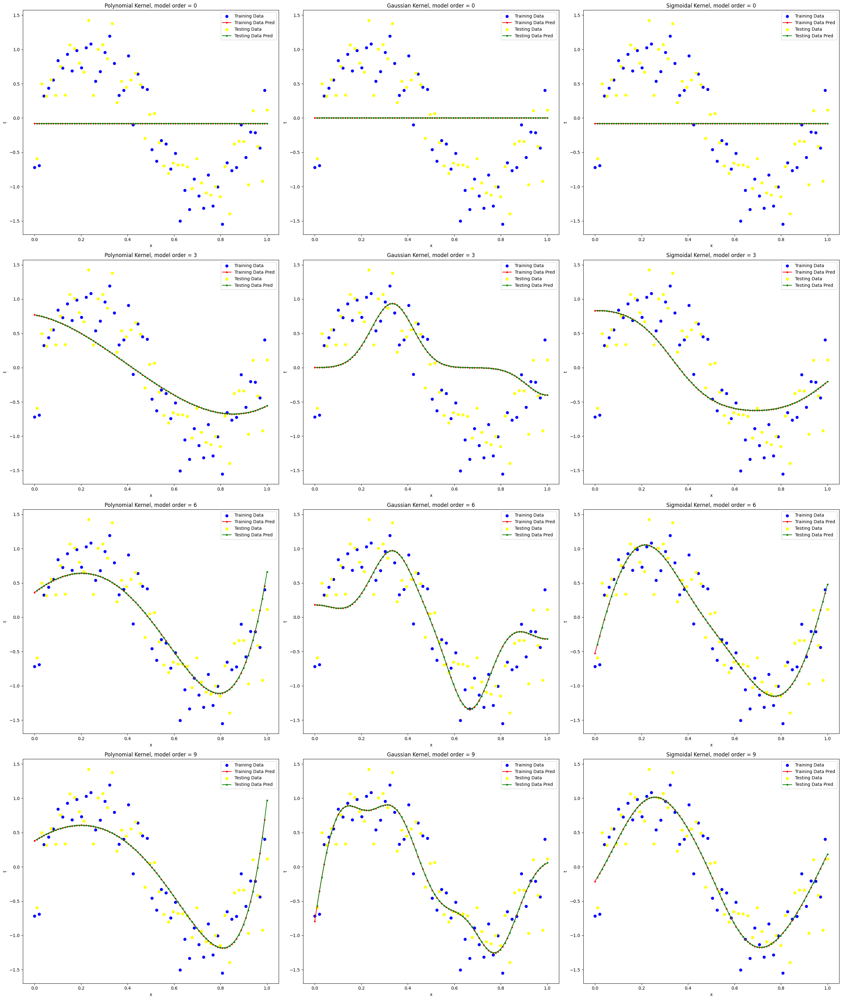

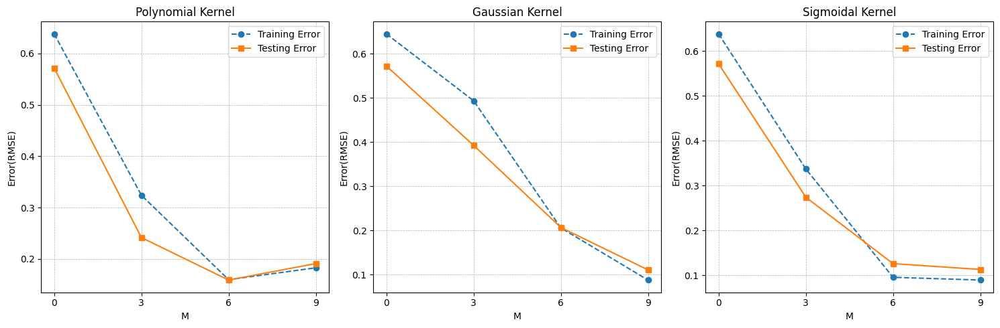

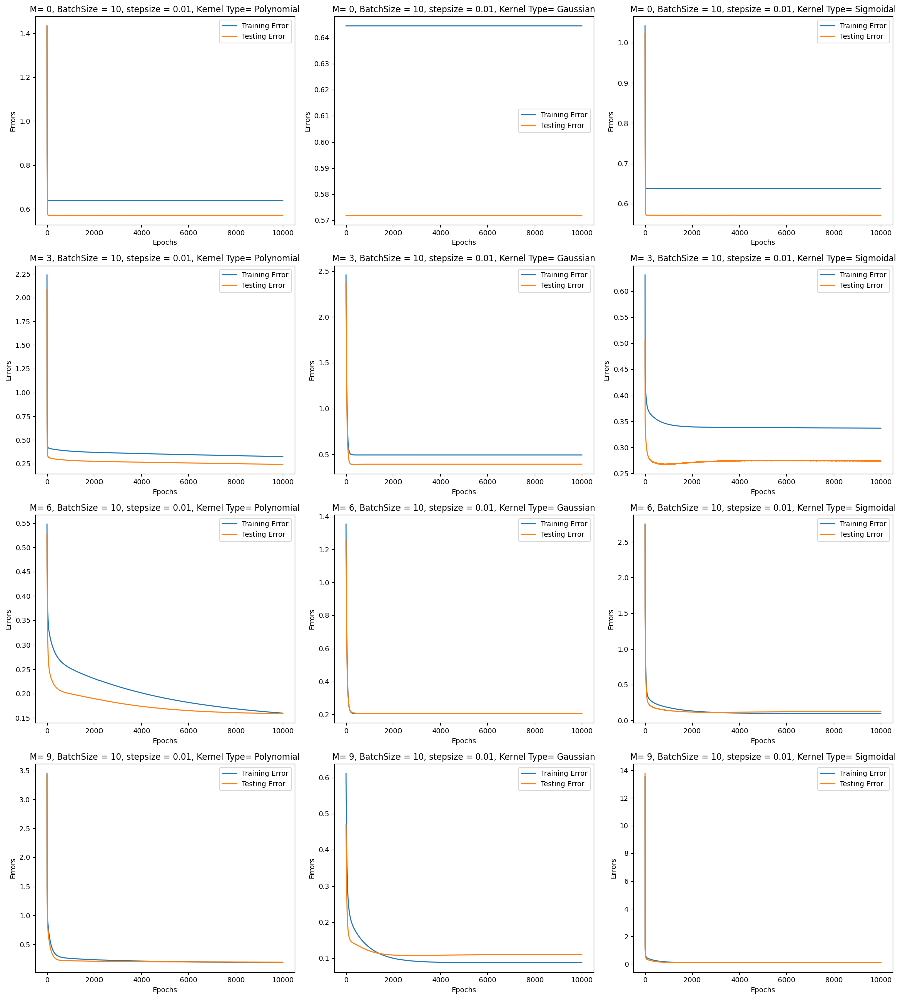

mimicking the the function used in part 3b and following SGD for weights, the plots for model orders have been cut down to 0, 3, 6, 9 to be noted that the polynomial fits for Model order >=3 is not plotted due to high error computations that can't be handled by python efficiently. as result, runtime warnings shall be raised
            


/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
<ipython-input-6-ec11c2547624>:40: RuntimeWarning: overflow encountered in square
  TrainError = np.mean((TrainPred - Y_train) ** 2)
<ipython-input-6-ec11c2547624>:41: RuntimeWarning: overflow encountered in square
  TestError = np.mean((TestPred - Y_test) ** 2)
<ipython-input-6-ec11c2547624>:71: RuntimeWarning: overflow encountered in matmul
  gradient = -2 * Phi.T @ (batch_Y - preds) / BatchSize
<ipython-input-6-ec11c2547624>:72: RuntimeWarning: invalid value encountered in subtract
  weights -= stepSize * gradient


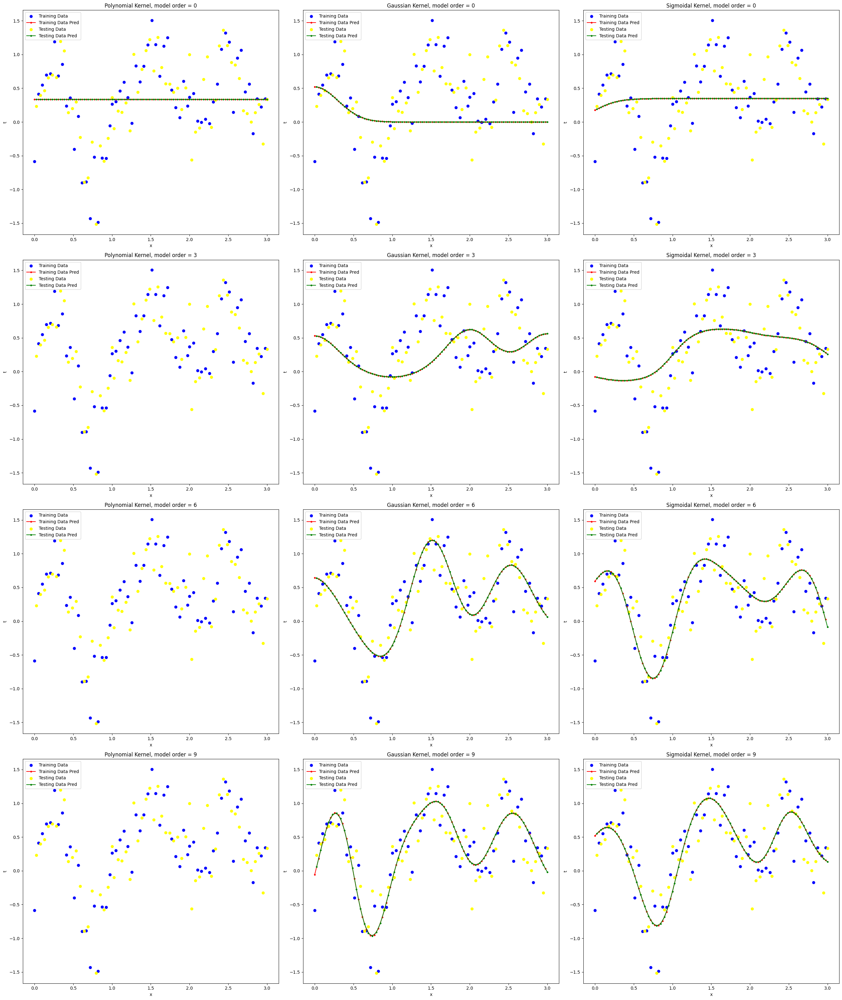

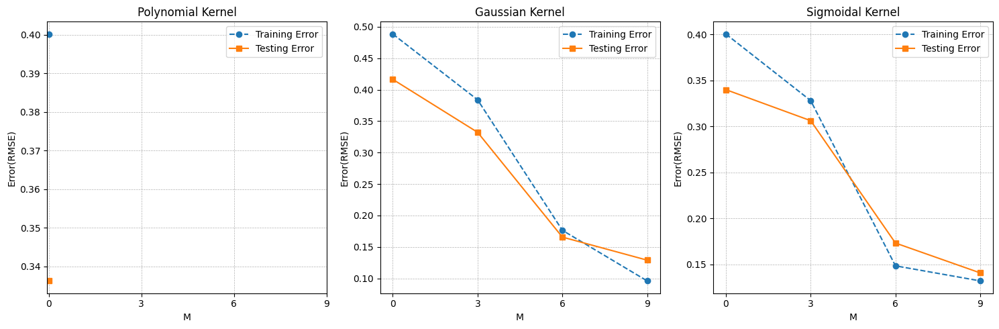

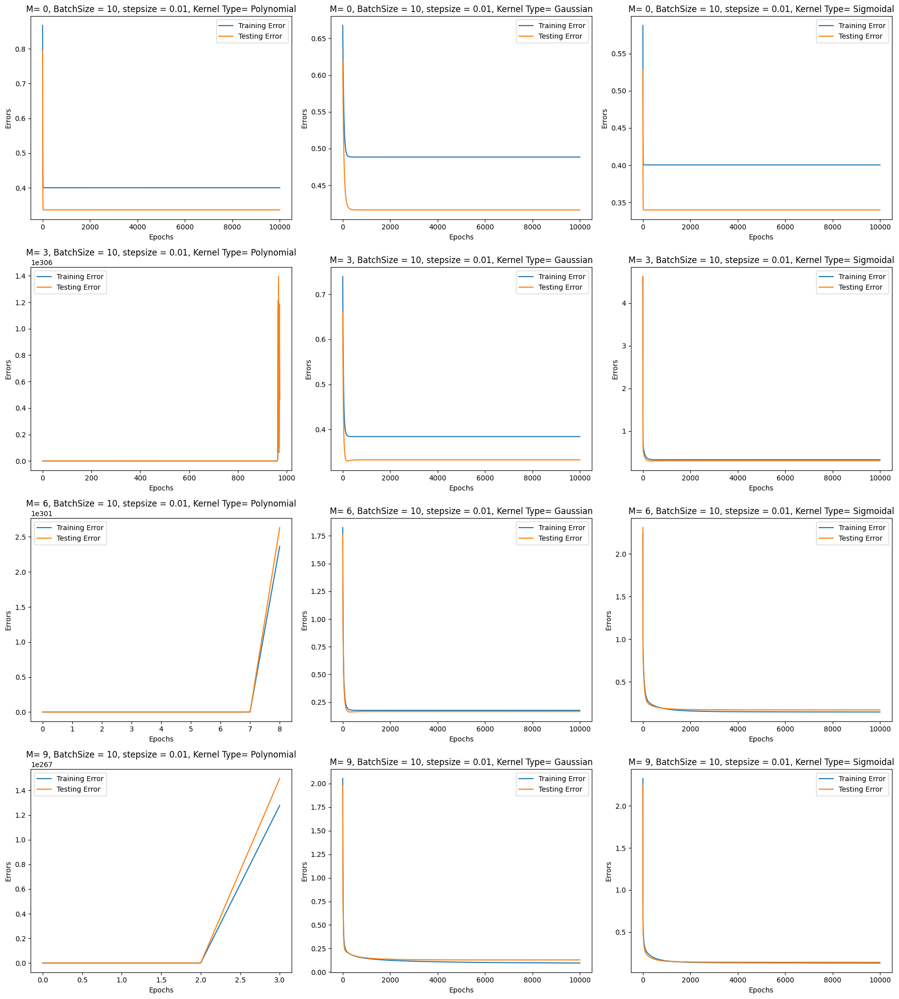

Studying the effect of stepSize on the convergence of weights
Data obtained from part 3a



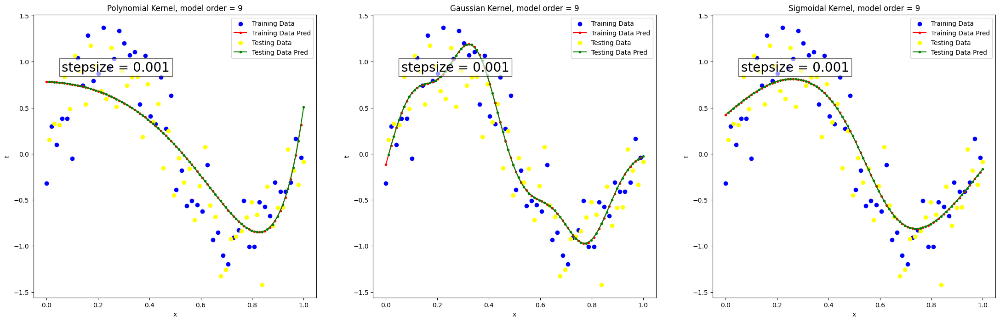

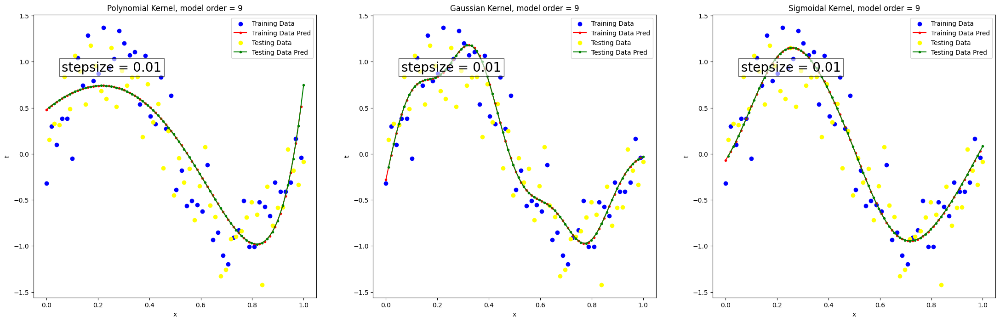

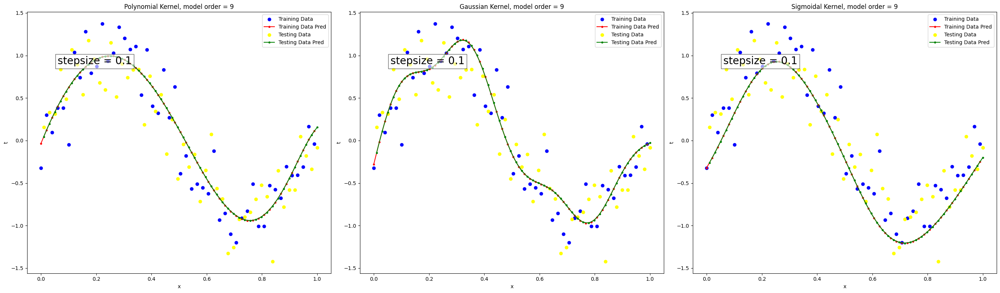

Studying the effect of batch-size on the speed of convergence
Data obtained from part 3a



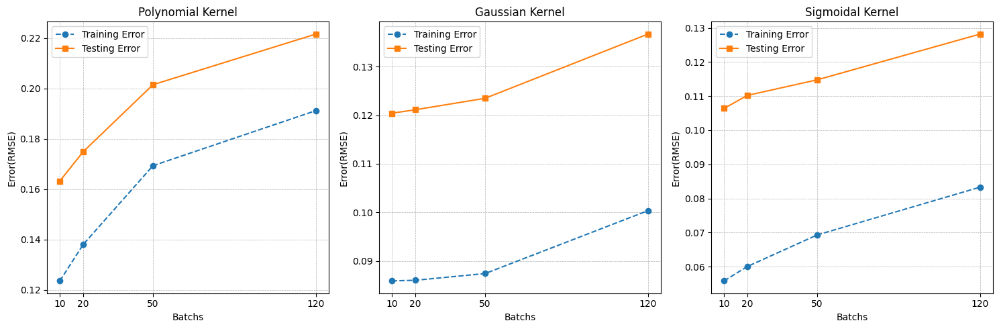

In [6]:

#Understanding online training
########################################
#Repeat 3(a) and 3(b) using stochastic gradient descent for weight update ( plot required results )
########################################

def ErrorPred(w_est,X_train,Y_train,X_test,Y_test,kernelType, means , sigma): #(estimated weight, training data, training targets, testing data, testing targets, type of the kernel )
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    # X_train = np.reshape(X_train, (-1,1))
    # Y_train = np.reshape(Y_train, (-1,1))
    # X_test = np.reshape(X_test, (-1,1))
    # Y_test = np.reshape(Y_test, (-1,1))
    X_tr = []
    X_te = []
    M = len(w_est)-1
    if kernelType.casefold()=='polynomial':
      #Use polynomial kernel to transform the data
      X_tr = polynomial_kernel_4(X_train, M)
      X_te = polynomial_kernel_4(X_test, M)

    if kernelType.casefold()=='gaussian':
      #Use Gaussian kernel to transofrm the data
      X_tr = gaussian_kernel_4(X_train, sigma, means)
      X_te = gaussian_kernel_4(X_test, sigma, means)

    if kernelType.casefold()=='sigmoidal':
      #Use sigmoidal kernel to transform the data
      X_tr = sigmoid_kernel_4(X_train, alpha =means , c =sigma)
      X_te = sigmoid_kernel_4(X_test, alpha =means , c =sigma)

    #Estimate training and testing targets
    TrainPred = X_tr @ w_est
    TestPred = X_te @ w_est



    #Compute and return the train and test errors

    # TrainPred = np.clip(TrainPred, -1e100, 1e100)
    # TestPred = np.clip(TestPred, -1e100, 1e100)
    TrainError = np.mean((TrainPred - Y_train) ** 2)
    TestError = np.mean((TestPred - Y_test) ** 2)

    #Compute and return the train and test errors
    return TrainError, TestError


def OnlineTraining(X_train,Y_train,X_test, Y_test, kernelType,M,Epochs,BatchSize,stepSize, means, sigma):
    #np.random.seed(42)  # For reproducibility
    num_features = M + 1
    weights = np.random.randn(num_features)
    training_errors = []
    testing_errors = []

    for epoch in range(Epochs):
        indices = np.random.permutation(len(X_train))  # Shuffle data
        X_train, Y_train = X_train[indices], Y_train[indices]

        for i in range(0, len(X_train), BatchSize):
            batch_X = X_train[i:i + BatchSize]
            batch_Y = Y_train[i:i + BatchSize]

            if kernelType == 'polynomial':
                Phi = polynomial_kernel_4(batch_X, M)
            elif kernelType == 'gaussian':
                Phi = gaussian_kernel_4(batch_X, sigma, means)
            elif kernelType == 'sigmoidal':
                Phi = sigmoid_kernel_4(batch_X, alpha=means, c=sigma)

            preds = Phi @ weights
            #preds = np.clip(preds, -1e100, 1e100)
            gradient = -2 * Phi.T @ (batch_Y - preds) / BatchSize
            weights -= stepSize * gradient


        tr_err, te_err = ErrorPred(weights, X_train, Y_train, X_test, Y_test, kernelType, means, sigma)
        training_errors.append(tr_err)
        testing_errors.append(te_err)

    return weights, training_errors, testing_errors

def OnlinePred_Error(w_est,X_train,Y_train,X_test,Y_test,kernelType, means, sigma): #(estimated weights, training data, training targets, testing data, testing targets, type of the kernel )
    #kernelType : {Polynomial,Gaussian,Sigmoid}
    #Initialize the required variables
    """Y_tr_pred,Y_te_pred = OnlinePred(w_est,X_train,X_test,kernelType, means, sigma)"""

    Y_tr_pred,Y_te_pred = [],[]
    M = len(w_est)-1

    #Obtain kernel representations
    if kernelType.casefold()=='polynomial':
      X_tr = polynomial_kernel_4(X_train, M)
      X_te = polynomial_kernel_4(X_test, M)

    if kernelType.casefold()=='gaussian':
      X_tr = gaussian_kernel_4(X_train, sigma, means)
      X_te = gaussian_kernel_4(X_test, sigma, means)

    if kernelType.casefold()=='sigmoidal':
      X_tr = sigmoid_kernel_4(X_train, alpha =means , c =sigma)
      X_te = sigmoid_kernel_4(X_test, alpha =means , c =sigma)

    #Compute and return the training and testing target estimates
    Y_tr_pred = X_tr @ w_est
    Y_te_pred = X_te @ w_est

    Y_tr_error = np.mean((Y_tr_pred - Y_train) ** 2)
    Y_te_error = np.mean((Y_te_pred - Y_test) ** 2)

    #Compute and return the training and testing errors
    return Y_tr_error,Y_te_error, Y_tr_pred, Y_te_pred

# Kernel Functions (Same as in part3.py)
def polynomial_kernel_4(x, M):
    return np.vander(x, M+1, increasing=True)

def gaussian_kernel_4(X, sigma, means):
    G = np.exp(-((X[:, None] - means) ** 2) / (2 * sigma ** 2))
    return G

def sigmoid_kernel_4(X, alpha, c):
    S = 1 / (1 + np.exp(-(X[:, None] - alpha) / c))
    return S

##################################################
#Repeat 3a with online training
##################################################

text_4_3a = """mimicking the the function used in part 3a and following SGD for weights, the plots for model orders have been cut down to 0, 3, 6, 9
            """
print(text_4_3a)

num_points = 100
x_sort_100 = np.linspace(0, 1, num_points)
#x_unsort_100 = np.random.choice(x_sort_100, size=num_points, replace = False)
noise_100 = np.random.normal(0, np.sqrt(0.1), num_points)
t_sort_100 = np.sin(2 * np.pi * x_sort_100) + noise_100


#Obtian train and test splits
#Take even samples for training and odd samples for testing

X_train = []
Y_train = []
X_test = []
Y_test = []

for i, x_val in enumerate(x_sort_100):
  if i % 2 == 0:
    X_train.append(x_val)
    Y_train.append(t_sort_100[i])
  else:
    X_test.append(x_val)
    Y_test.append(t_sort_100[i])

X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_test = np.array(X_test)
Y_test = np.array(Y_test)

Epochs =10000
BatchSize =10
stepSize =0.01
M_range = list(range(0, 10, 3))



def part4_3a(X_train, Y_train, X_test, Y_test, M_range, Epochs, BatchSize, stepSize):
  polynomial_tr_error =[]
  polynomial_te_error = []
  gaussian_tr_error = []
  gaussian_te_error = []
  sigmoid_tr_error =[]
  sigmoid_te_error = []
  fig, axes = plt.subplots(len(M_range), 3, figsize=(27, 80*len(M_range)/10))
  tr_Errors_poly, tr_Errors_gauss, tr_Errors_sigmoid = [], [], []
  te_Errors_poly, te_Errors_gauss, te_Errors_sigmoid = [], [], []


  for i, M in enumerate(M_range):
    w_opt_poly , training_errors_poly, testing_errors_poly = OnlineTraining(X_train, Y_train, X_test, Y_test, 'polynomial', M,Epochs,BatchSize,stepSize, means = [], sigma = 0)
    w_opt_gauss, training_errors_gauss, testing_errors_gauss  = OnlineTraining(X_train, Y_train, X_test, Y_test, 'gaussian', M, Epochs,BatchSize,stepSize, means = np.linspace(-1, 1, M+1), sigma = 0.09)
    w_opt_sigmoid, training_errors_sigmoid, testing_errors_sigmoid  = OnlineTraining(X_train, Y_train, X_test, Y_test, 'sigmoidal', M, Epochs,BatchSize,stepSize, means = np.linspace(-1, 1, M+1), sigma = 0.09)

    TrainErrorPoly, TestErrorPoly, TrainPredPoly, TestPredPoly = OnlinePred_Error(w_opt_poly,X_train,Y_train,X_test,Y_test,'polynomial', means = [], sigma = 0)
    TrainErrorGauss, TestErrorGauss, TrainPredGauss, TestPredGauss = OnlinePred_Error(w_opt_gauss,X_train,Y_train,X_test,Y_test,'gaussian', means = np.linspace(-1, 1, M+1), sigma = 0.09)
    TrainErrorSigmoid, TestErrorSigmoid, TrainPredSigmoid, TestPredSigmoid = OnlinePred_Error(w_opt_sigmoid,X_train,Y_train,X_test,Y_test,'sigmoidal', means = np.linspace(-1, 1, M+1), sigma = 0.09)

    tr_Errors_poly.append(training_errors_poly)
    tr_Errors_gauss.append(training_errors_gauss)
    tr_Errors_sigmoid.append(training_errors_sigmoid)
    te_Errors_poly.append(testing_errors_poly)
    te_Errors_gauss.append(testing_errors_gauss)
    te_Errors_sigmoid.append(testing_errors_sigmoid)

    polynomial_tr_error.append(TrainErrorPoly)
    polynomial_te_error.append(TestErrorPoly)
    gaussian_tr_error.append(TrainErrorGauss)
    gaussian_te_error.append(TestErrorGauss)
    sigmoid_tr_error.append(TrainErrorSigmoid)
    sigmoid_te_error.append(TestErrorSigmoid)

    axes[i][0].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
    axes[i][0].plot(X_train, TrainPredPoly, label='Training Data Pred', marker = '.', color ='red')
    axes[i][0].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
    axes[i][0].plot(X_test, TestPredPoly, label='Testing Data Pred', marker = '.', color ='green')
    axes[i][0].set_title(f'Polynomial Kernel, model order = {M}')
    axes[i][0].set_xlabel('x')
    axes[i][0].set_ylabel('t')
    axes[i][0].legend()

    axes[i][1].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
    axes[i][1].plot(X_train, TrainPredGauss, label='Training Data Pred', marker = '.', color ='red')
    axes[i][1].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
    axes[i][1].plot(X_test, TestPredGauss, label='Testing Data Pred', marker = '.', color ='green')
    axes[i][1].set_title(f'Gaussian Kernel, model order = {M}')
    axes[i][1].set_xlabel('x')
    axes[i][1].set_ylabel('t')
    axes[i][1].legend()

    axes[i][2].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
    axes[i][2].plot(X_train, TrainPredSigmoid, label='Training Data Pred', marker = '.', color ='red')
    axes[i][2].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
    axes[i][2].plot(X_test, TestPredSigmoid, label='Testing Data Pred', marker = '.', color ='green')
    axes[i][2].set_title(f'Sigmoidal Kernel, model order = {M}')
    axes[i][2].set_xlabel('x')
    axes[i][2].set_ylabel('t')
    axes[i][2].legend()

  plt.tight_layout()
  plt.show()

  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  axes[0].plot(M_range, polynomial_tr_error, label='Training Error', linestyle='--', marker = 'o')
  axes[0].plot(M_range, polynomial_te_error, label='Testing Error', marker = 's')
  axes[0].set_title('Polynomial Kernel')
  axes[0].set_xlabel('M')
  axes[0].set_xticks(M_range)
  axes[0].set_ylabel('Error(RMSE)')
  axes[0].legend()
  axes[0].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

  axes[1].plot(M_range, gaussian_tr_error, label='Training Error', linestyle='--', marker = 'o')
  axes[1].plot(M_range, gaussian_te_error, label='Testing Error', marker = 's')
  axes[1].set_title('Gaussian Kernel')
  axes[1].set_xlabel('M')
  axes[1].set_xticks(M_range)
  axes[1].set_ylabel('Error(RMSE)')
  axes[1].legend()
  axes[1].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

  axes[2].plot(M_range, sigmoid_tr_error, label='Training Error', linestyle='--', marker = 'o')
  axes[2].plot(M_range, sigmoid_te_error, label='Testing Error', marker = 's')
  axes[2].set_title('Sigmoidal Kernel')
  axes[2].set_xlabel('M')
  axes[2].set_xticks(M_range)
  axes[2].set_ylabel('Error(RMSE)')
  axes[2].legend()
  axes[2].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

  plt.tight_layout()
  plt.show()
  fig, axes = plt.subplots(len(M_range), 3, figsize=(18, 5*len(M_range)))
  for tr_err, te_err, M in zip(tr_Errors_poly, te_Errors_poly, M_range):
    axes[M//3][0].plot(list(range(Epochs)), tr_err, label='Training Error')
    axes[M//3][0].plot(list(range(Epochs)), te_err, label='Testing Error')
    axes[M//3][0].set_xlabel('Epochs')
    axes[M//3][0].set_ylabel("Errors")
    axes[M//3][0].legend()
    axes[M//3][0].set_title(f"M= {M}, BatchSize = {BatchSize}, stepsize = {stepSize}, Kernel Type= Polynomial")

  for tr_err, te_err,M in zip(tr_Errors_gauss, te_Errors_gauss, M_range):
    axes[M//3][1].plot(list(range(Epochs)), tr_err, label='Training Error')
    axes[M//3][1].plot(list(range(Epochs)), te_err, label='Testing Error')
    axes[M//3][1].set_xlabel('Epochs')
    axes[M//3][1].set_ylabel("Errors")
    axes[M//3][1].legend()
    axes[M//3][1].set_title(f"M= {M}, BatchSize = {BatchSize}, stepsize = {stepSize}, Kernel Type= Gaussian")


  for tr_err, te_err,M in zip(tr_Errors_sigmoid, te_Errors_sigmoid, M_range):
    axes[M//3][2].plot(list(range(Epochs)), tr_err, label='Training Error')
    axes[M//3][2].plot(list(range(Epochs)), te_err, label='Testing Error')
    axes[M//3][2].set_xlabel('Epochs')
    axes[M//3][2].set_ylabel("Errors")
    axes[M//3][2].legend()
    axes[M//3][2].set_title(f"M= {M}, BatchSize = {BatchSize}, stepsize = {stepSize}, Kernel Type= Sigmoidal")

  plt.tight_layout()
  plt.show()

part4_3a(X_train, Y_train, X_test, Y_test, M_range, Epochs, BatchSize, stepSize)

##################################################
#Repeat 3b with online training
##################################################

text_4_3b = """mimicking the the function used in part 3b and following SGD for weights, the plots for model orders have been cut down to 0, 3, 6, 9 to be noted that the polynomial fits for Model order >=3 is not plotted due to high error computations that can't be handled by python efficiently. as result, runtime warnings shall be raised
            """
print(text_4_3b)

num_points_part_b = 120

x_sort1 = np.linspace(0, 1, num_points_part_b//3)
x_sort2 = np.linspace(1, 2, num_points_part_b//3)
x_sort3 = np.linspace(2, 3, num_points_part_b//3)

noice = np.random.normal(0, np.sqrt(0.1), num_points_part_b)

t_sort1 = np.sin(2 * np.pi * x_sort1)
t_sort2 = -2 * abs(x_sort2 - 1.5) + 1 #0.5 - np.abs(x_sort2 - 1.5)
t_sort3 = np.exp(-((x_sort3 - 2.5) ** 2) / (2 * (0.15 ** 2))) #operator precedence is important

x_sort = np.concatenate((x_sort1, x_sort2, x_sort3), axis = 0)
t_sort = np.concatenate((t_sort1, t_sort2, t_sort3), axis = 0) + noice

X_train = []
Y_train = []
X_test = []
Y_test = []

for i, x_val in enumerate(x_sort):
  if i % 2 == 0:
    X_train.append(x_val)
    Y_train.append(t_sort[i])
  else:
    X_test.append(x_val)
    Y_test.append(t_sort[i])


X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_test = np.array(X_test)
Y_test = np.array(Y_test)


Epochs =10000
BatchSize =10
stepSize =0.01
M_range = list(range(0, 10, 3))


def part4_3b(X_train, Y_train, X_test, Y_test, M_range, Epochs, BatchSize, stepSize):
  polynomial_tr_error =[]
  polynomial_te_error = []
  gaussian_tr_error = []
  gaussian_te_error = []
  sigmoid_tr_error =[]
  sigmoid_te_error = []
  fig, axes = plt.subplots(len(M_range), 3, figsize=(27, 80*(len(M_range)/10)))
  tr_Errors_poly, tr_Errors_gauss, tr_Errors_sigmoid = [], [], []
  te_Errors_poly, te_Errors_gauss, te_Errors_sigmoid = [], [], []

  for i, M in enumerate(M_range):
    w_opt_poly , training_errors_poly, testing_errors_poly = OnlineTraining(X_train, Y_train, X_test, Y_test, 'polynomial', M, Epochs, BatchSize, stepSize, means = [], sigma = 0)
    w_opt_gauss, training_errors_gauss, testing_errors_gauss  = OnlineTraining(X_train, Y_train, X_test, Y_test, 'gaussian', M, Epochs,BatchSize, stepSize, means = np.linspace(0, 3, M+1), sigma = 0.3)
    w_opt_sigmoid, training_errors_sigmoid, testing_errors_sigmoid  = OnlineTraining(X_train, Y_train, X_test, Y_test, 'sigmoidal', M, Epochs,BatchSize, stepSize, means = np.linspace(0, 3, M+1), sigma = 0.15)

    TrainErrorPoly, TestErrorPoly, TrainPredPoly, TestPredPoly = OnlinePred_Error(w_opt_poly,X_train,Y_train,X_test,Y_test,'polynomial', means = [], sigma = 0)
    TrainErrorGauss, TestErrorGauss, TrainPredGauss, TestPredGauss = OnlinePred_Error(w_opt_gauss,X_train,Y_train,X_test,Y_test,'gaussian', means = np.linspace(0, 3, M+1), sigma = 0.3)
    TrainErrorSigmoid, TestErrorSigmoid, TrainPredSigmoid, TestPredSigmoid = OnlinePred_Error(w_opt_sigmoid,X_train,Y_train,X_test,Y_test,'sigmoidal', means = np.linspace(0, 3, M+1), sigma = 0.15)

    tr_Errors_poly.append(training_errors_poly)
    tr_Errors_gauss.append(training_errors_gauss)
    tr_Errors_sigmoid.append(training_errors_sigmoid)
    te_Errors_poly.append(testing_errors_poly)
    te_Errors_gauss.append(testing_errors_gauss)
    te_Errors_sigmoid.append(testing_errors_sigmoid)

    polynomial_tr_error.append(TrainErrorPoly)
    polynomial_te_error.append(TestErrorPoly)
    gaussian_tr_error.append(TrainErrorGauss)
    gaussian_te_error.append(TestErrorGauss)
    sigmoid_tr_error.append(TrainErrorSigmoid)
    sigmoid_te_error.append(TestErrorSigmoid)

    axes[i][0].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
    axes[i][0].plot(X_train, TrainPredPoly, label='Training Data Pred', marker = '.', color ='red')
    axes[i][0].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
    axes[i][0].plot(X_test, TestPredPoly, label='Testing Data Pred', marker = '.', color ='green')
    axes[i][0].set_title(f'Polynomial Kernel, model order = {M}')
    axes[i][0].set_xlabel('x')
    axes[i][0].set_ylabel('t')
    axes[i][0].legend()

    axes[i][1].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
    axes[i][1].plot(X_train, TrainPredGauss, label='Training Data Pred', marker = '.', color ='red')
    axes[i][1].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
    axes[i][1].plot(X_test, TestPredGauss, label='Testing Data Pred', marker = '.', color ='green')
    axes[i][1].set_title(f'Gaussian Kernel, model order = {M}')
    axes[i][1].set_xlabel('x')
    axes[i][1].set_ylabel('t')
    axes[i][1].legend()

    axes[i][2].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
    axes[i][2].plot(X_train, TrainPredSigmoid, label='Training Data Pred', marker = '.', color ='red')
    axes[i][2].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
    axes[i][2].plot(X_test, TestPredSigmoid, label='Testing Data Pred', marker = '.', color ='green')
    axes[i][2].set_title(f'Sigmoidal Kernel, model order = {M}')
    axes[i][2].set_xlabel('x')
    axes[i][2].set_ylabel('t')
    axes[i][2].legend()

  plt.tight_layout()
  plt.show()

  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  axes[0].plot(M_range, polynomial_tr_error, label='Training Error', linestyle='--', marker = 'o')
  axes[0].plot(M_range, polynomial_te_error, label='Testing Error', marker = 's')
  axes[0].set_title('Polynomial Kernel')
  axes[0].set_xlabel('M')
  axes[0].set_xticks(M_range)
  axes[0].set_ylabel('Error(RMSE)')
  axes[0].legend()
  axes[0].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

  axes[1].plot(M_range, gaussian_tr_error, label='Training Error', linestyle='--', marker = 'o')
  axes[1].plot(M_range, gaussian_te_error, label='Testing Error', marker = 's')
  axes[1].set_title('Gaussian Kernel')
  axes[1].set_xlabel('M')
  axes[1].set_xticks(M_range)
  axes[1].set_ylabel('Error(RMSE)')
  axes[1].legend()
  axes[1].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

  axes[2].plot(M_range, sigmoid_tr_error, label='Training Error', linestyle='--', marker = 'o')
  axes[2].plot(M_range, sigmoid_te_error, label='Testing Error', marker = 's')
  axes[2].set_title('Sigmoidal Kernel')
  axes[2].set_xlabel('M')
  axes[2].set_xticks(M_range)
  axes[2].set_ylabel('Error(RMSE)')
  axes[2].legend()
  axes[2].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

  plt.tight_layout()
  plt.show()

  fig, axes = plt.subplots(len(M_range), 3, figsize=(18, 5*len(M_range)))
  for tr_err, te_err, M in zip(tr_Errors_poly, te_Errors_poly, M_range):
    axes[M//3][0].plot(list(range(Epochs)), tr_err, label='Training Error')
    axes[M//3][0].plot(list(range(Epochs)), te_err, label='Testing Error')
    axes[M//3][0].set_xlabel('Epochs')
    axes[M//3][0].set_ylabel("Errors")
    axes[M//3][0].legend()
    axes[M//3][0].set_title(f"M= {M}, BatchSize = {BatchSize}, stepsize = {stepSize}, Kernel Type= Polynomial")

  for tr_err, te_err,M in zip(tr_Errors_gauss, te_Errors_gauss, M_range):
    figsize=(6, 5)
    axes[M//3][1].plot(list(range(Epochs)), tr_err, label='Training Error')
    axes[M//3][1].plot(list(range(Epochs)), te_err, label='Testing Error')
    axes[M//3][1].set_xlabel('Epochs')
    axes[M//3][1].set_ylabel("Errors")
    axes[M//3][1].legend()
    axes[M//3][1].set_title(f"M= {M}, BatchSize = {BatchSize}, stepsize = {stepSize}, Kernel Type= Gaussian")
    #axes[i][1].show()

  for tr_err, te_err,M in zip(tr_Errors_sigmoid, te_Errors_sigmoid, M_range):
    figsize=(6, 5)
    axes[M//3][2].plot(list(range(Epochs)), tr_err, label='Training Error')
    axes[M//3][2].plot(list(range(Epochs)), te_err, label='Testing Error')
    axes[M//3][2].set_xlabel('Epochs')
    axes[M//3][2].set_ylabel("Errors")
    axes[M//3][2].legend()
    axes[M//3][2].set_title(f"M= {M}, BatchSize = {BatchSize}, stepsize = {stepSize}, Kernel Type= Sigmoidal")

  plt.tight_layout()
  plt.show()

part4_3b(X_train, Y_train, X_test, Y_test, M_range, Epochs, BatchSize, stepSize)


########################################
#Study the effect of stepSize on the convergence of weights ( plot required results )
########################################

print("Studying the effect of stepSize on the convergence of weights\nData obtained from part 3a\n")

#training and testing data is from part 3a
num_points = 100
x_sort_100 = np.linspace(0, 1, num_points)
#x_unsort_100 = np.random.choice(x_sort_100, size=num_points, replace = False)
noise_100 = np.random.normal(0, np.sqrt(0.1), num_points)
t_sort_100 = np.sin(2 * np.pi * x_sort_100) + noise_100


#Obtian train and test splits
#Take even samples for training and odd samples for testing

X_train = []
Y_train = []
X_test = []
Y_test = []

for i, x_val in enumerate(x_sort_100):
  if i % 2 == 0:
    X_train.append(x_val)
    Y_train.append(t_sort_100[i])
  else:
    X_test.append(x_val)
    Y_test.append(t_sort_100[i])

X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_test = np.array(X_test)
Y_test = np.array(Y_test)

M = 9 #model order shall be changed as and when required
Epochs =10000
BatchSize =10

steps = [0.001, 0.01, 0.1,]# 0.005, 0.05, 0.5]
for step in steps:
  polynomial_tr_error =[]
  polynomial_te_error = []
  gaussian_tr_error = []
  gaussian_te_error = []
  sigmoid_tr_error =[]
  sigmoid_te_error = []
  fig, axes = plt.subplots(1, 3, figsize=(27, 8))

  w_opt_poly , training_errors_poly, testing_errors_poly = OnlineTraining(X_train, Y_train, X_test, Y_test, 'polynomial', M,Epochs,BatchSize,step, means = [], sigma = 0)
  w_opt_gauss, training_errors_gauss, testing_errors_gauss  = OnlineTraining(X_train, Y_train, X_test, Y_test, 'gaussian', M, Epochs,BatchSize,step, means = np.linspace(-1, 1, M+1), sigma = 0.09)
  w_opt_sigmoid, training_errors_sigmoid, testing_errors_sigmoid  = OnlineTraining(X_train, Y_train, X_test, Y_test, 'sigmoidal', M, Epochs,BatchSize,step, means = np.linspace(-1, 1, M+1), sigma = 0.09)

  TrainErrorPoly, TestErrorPoly, TrainPredPoly, TestPredPoly = OnlinePred_Error(w_opt_poly,X_train,Y_train,X_test,Y_test,'polynomial', means = [], sigma = 0)
  TrainErrorGauss, TestErrorGauss, TrainPredGauss, TestPredGauss = OnlinePred_Error(w_opt_gauss,X_train,Y_train,X_test,Y_test,'gaussian', means = np.linspace(-1, 1, M+1), sigma = 0.09)
  TrainErrorSigmoid, TestErrorSigmoid, TrainPredSigmoid, TestPredSigmoid = OnlinePred_Error(w_opt_sigmoid,X_train,Y_train,X_test,Y_test,'sigmoidal', means = np.linspace(-1, 1, M+1), sigma = 0.09)

  polynomial_tr_error.append(TrainErrorPoly)
  polynomial_te_error.append(TestErrorPoly)
  gaussian_tr_error.append(TrainErrorGauss)
  gaussian_te_error.append(TestErrorGauss)
  sigmoid_tr_error.append(TrainErrorSigmoid)
  sigmoid_te_error.append(TestErrorSigmoid)

  axes[0].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
  axes[0].plot(X_train, TrainPredPoly, label='Training Data Pred', marker = '.', color ='red')
  axes[0].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
  axes[0].plot(X_test, TestPredPoly, label='Testing Data Pred', marker = '.', color ='green')
  axes[0].set_title(f'Polynomial Kernel, model order = {M}')
  axes[0].set_xlabel('x')
  axes[0].set_ylabel('t')
  axes[0].legend()
  axes[0].text(0.1, 0.8, f'stepsize = {step}', transform=axes[0].transAxes, fontsize=20, bbox=dict(facecolor='white', alpha=0.6))

  axes[1].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
  axes[1].plot(X_train, TrainPredGauss, label='Training Data Pred', marker = '.', color ='red')
  axes[1].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
  axes[1].plot(X_test, TestPredGauss, label='Testing Data Pred', marker = '.', color ='green')
  axes[1].set_title(f'Gaussian Kernel, model order = {M}')
  axes[1].set_xlabel('x')
  axes[1].set_ylabel('t')
  axes[1].legend()
  axes[1].text(0.1, 0.8, f'stepsize = {step}', transform=axes[1].transAxes, fontsize=20, bbox=dict(facecolor='white', alpha=0.6))

  axes[2].scatter(X_train, Y_train, label='Training Data', marker = 'o', color ='blue')
  axes[2].plot(X_train, TrainPredSigmoid, label='Training Data Pred', marker = '.', color ='red')
  axes[2].scatter(X_test, Y_test, label='Testing Data', marker = 'o', color ='yellow')
  axes[2].plot(X_test, TestPredSigmoid, label='Testing Data Pred', marker = '.', color ='green')
  axes[2].set_title(f'Sigmoidal Kernel, model order = {M}')
  axes[2].set_xlabel('x')
  axes[2].set_ylabel('t')
  axes[2].legend()
  axes[2].text(0.1, 0.8, f'stepsize = {step}', transform=axes[2].transAxes, fontsize=20, bbox=dict(facecolor='white', alpha=0.6))


plt.tight_layout()
plt.show()



########################################
#Study the effect of batchsize on the speed of convergence ( plot required results )
########################################
print("Studying the effect of batch-size on the speed of convergence\nData obtained from part 3a\n")

#training and testing data is from part 3a
num_points = 100
x_sort_100 = np.linspace(0, 1, num_points)
#x_unsort_100 = np.random.choice(x_sort_100, size=num_points, replace = False)
noise_100 = np.random.normal(0, np.sqrt(0.1), num_points)
t_sort_100 = np.sin(2 * np.pi * x_sort_100) + noise_100


#Obtian train and test splits
#Take even samples for training and odd samples for testing

X_train = []
Y_train = []
X_test = []
Y_test = []

for i, x_val in enumerate(x_sort_100):
  if i % 2 == 0:
    X_train.append(x_val)
    Y_train.append(t_sort_100[i])
  else:
    X_test.append(x_val)
    Y_test.append(t_sort_100[i])

X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_test = np.array(X_test)
Y_test = np.array(Y_test)

M = 9 #model order shall be changed as and when required
Epochs =10000
stepSize =0.01

Batchs = [10, 20, 50, 120]

polynomial_tr_error =[]
polynomial_te_error = []
gaussian_tr_error = []
gaussian_te_error = []
sigmoid_tr_error =[]
sigmoid_te_error = []

for Batch in Batchs:
  w_opt_poly , training_errors_poly, testing_errors_poly = OnlineTraining(X_train, Y_train, X_test, Y_test, 'polynomial', M,Epochs,Batch,stepSize, means = [], sigma = 0)
  w_opt_gauss, training_errors_gauss, testing_errors_gauss  = OnlineTraining(X_train, Y_train, X_test, Y_test, 'gaussian', M, Epochs,Batch,stepSize, means = np.linspace(-1, 1, M+1), sigma = 0.09)
  w_opt_sigmoid, training_errors_sigmoid, testing_errors_sigmoid  = OnlineTraining(X_train, Y_train, X_test, Y_test, 'sigmoidal', M, Epochs,Batch,stepSize, means = np.linspace(-1, 1, M+1), sigma = 0.09)


  TrainErrorPoly, TestErrorPoly, TrainPredPoly, TestPredPoly = OnlinePred_Error(w_opt_poly,X_train,Y_train,X_test,Y_test,'polynomial', means = [], sigma = 0)
  TrainErrorGauss, TestErrorGauss, TrainPredGauss, TestPredGauss = OnlinePred_Error(w_opt_gauss,X_train,Y_train,X_test,Y_test,'gaussian', means = np.linspace(-1, 1, M+1), sigma = 0.09)
  TrainErrorSigmoid, TestErrorSigmoid, TrainPredSigmoid, TestPredSigmoid = OnlinePred_Error(w_opt_sigmoid,X_train,Y_train,X_test,Y_test,'sigmoidal', means = np.linspace(-1, 1, M+1), sigma = 0.09)



  polynomial_tr_error.append(TrainErrorPoly)
  polynomial_te_error.append(TestErrorPoly)
  gaussian_tr_error.append(TrainErrorGauss)
  gaussian_te_error.append(TestErrorGauss)
  sigmoid_tr_error.append(TrainErrorSigmoid)
  sigmoid_te_error.append(TestErrorSigmoid)



fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].plot(Batchs, polynomial_tr_error, label='Training Error', linestyle='--', marker = 'o')
axes[0].plot(Batchs, polynomial_te_error, label='Testing Error', marker = 's')
axes[0].set_title('Polynomial Kernel')
axes[0].set_xlabel('Batchs')
axes[0].set_xticks(Batchs)
axes[0].set_ylabel('Error(RMSE)')
axes[0].legend()
axes[0].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

axes[1].plot(Batchs, gaussian_tr_error, label='Training Error', linestyle='--', marker = 'o')
axes[1].plot(Batchs, gaussian_te_error, label='Testing Error', marker = 's')
axes[1].set_title('Gaussian Kernel')
axes[1].set_xlabel('Batchs')
axes[1].set_xticks(Batchs)
axes[1].set_ylabel('Error(RMSE)')
axes[1].legend()
axes[1].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

axes[2].plot(Batchs, sigmoid_tr_error, label='Training Error', linestyle='--', marker = 'o')
axes[2].plot(Batchs, sigmoid_te_error, label='Testing Error', marker = 's')
axes[2].set_title('Sigmoidal Kernel')
axes[2].set_xlabel('Batchs')
axes[2].set_xticks(Batchs)
axes[2].set_ylabel('Error(RMSE)')
axes[2].legend()
axes[2].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

plt.tight_layout()
plt.show()



<b> Report your observations </b>

1. Polynomial Fit doesn't work for large errors that come,

2.  as Epochs increase, the errors decrease drastically but the variances in errors still persists

3.  plots fit correctly for points with low $\eta$ like $0.01$



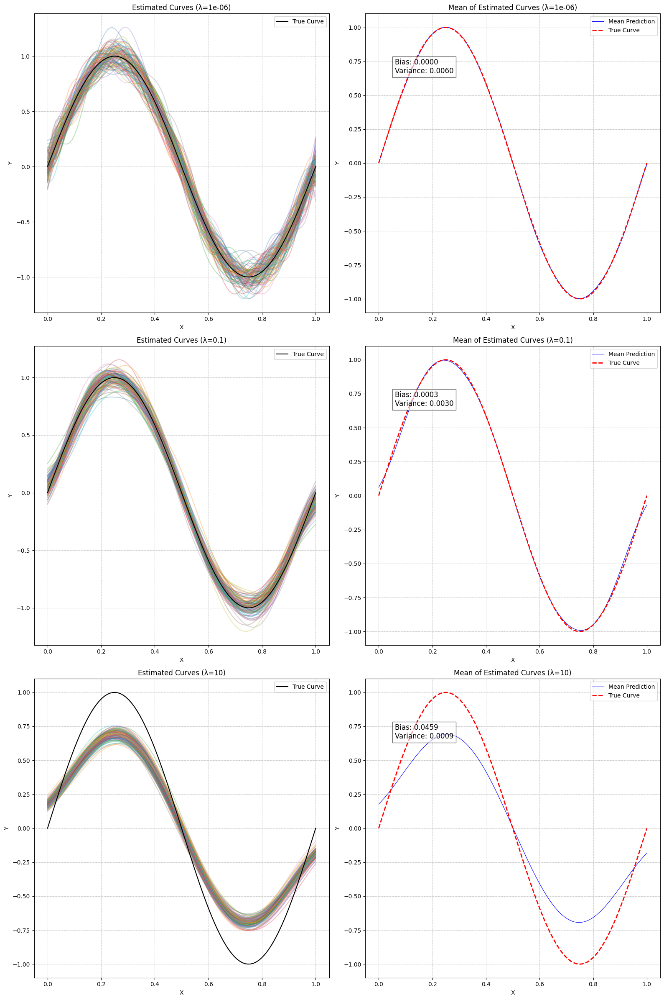

In [ ]:
#Understanding the bias-variance trade-off
########################################
#Generate 100 data sets of noisy sinusoidal data
########################################

L = 100  # Number of datasets
N = 25   # Number of points per dataset
M = 25   # Model order (24 Gaussian basis + 1 bias term)

def generate_data(N, noise_std):
    x = np.linspace(0, 1, N)
    y = np.sin(2 * np.pi * x) + np.random.normal(0, noise_std, N)
    return x, y

# Gaussian basis functions
def gaussian_basis(x, centers, width):
    """
        broadcasing x with centers
    """
    return np.exp(-((x[:, None] - centers[None, :]) ** 2) / (2 *( width ** 2)))


########################################
#Use regularized least squares to estimate w
########################################

# Fit model using regularized least squares
def fit_model(x, y, centers, lam):
    X = gaussian_basis(x, centers, 0.1) #width = 0.1
    X = np.hstack([np.ones((X.shape[0], 1)), X])  # Add bias term
    #w = np.linalg.inv(X.T @ X + lam * np.eye(X.shape[1])) @ X.T @ y
    w = np.linalg.solve(X.T @ X + lam * np.eye(X.shape[1]), X.T @ y)  #np.eye(X.shape[1]) = np.identity(X.shape[1])
    return w

# Prediction function
def predict(x, w, centers):
    X = gaussian_basis(x, centers, 0.1)   #width of gaussian basis functions be 0.1
    X = np.hstack([np.ones((X.shape[0], 1)), X])
    return X @ w

centers = np.linspace(0, 1, M - 1)
x_plot = np.linspace(0, 1, 100)
true_y = np.sin(2 * np.pi * x_plot)
########################################
#Illustrate the concept of Bias-Variance trade off
########################################
#1. Chose three different regularization coefficeints (low,middle and high)
lambdas = [1e-6, 0.1, 10,]# 0.01, 1, 100]   # Low, middle, and high regularization

#2. For every regularization coefficient, produce two plots: one displaying 100 estimated curves, and the other showing the mean of the estimated curves alongside the original function.
#3. For three regularization coefficients, you should have a total of six plots, meaning two plots for each regularization.
fig, axes = plt.subplots(len(lambdas), 2, figsize=(16, 24))
#fig.suptitle("Bias - Variance trade off")
for i, lam in enumerate(lambdas):
    predictions = []
    for _ in range(L):
        """
            iterating upto L iterations but not using the values
            by escaping with blank identifier '_'
        """
        x, y = generate_data(N, 0.1)  #std for gausian noice = 0.1
        w = fit_model(x, y, centers, lam)
        predictions.append(predict(x_plot, w, centers))

    predictions = np.array(predictions)

    # Plot 100 estimated curves
    axes[i][0].plot(x_plot, predictions.T, alpha=0.3)
    axes[i][0].plot(x_plot, true_y, color = 'black', label='True Curve')
    axes[i][0].set_title(f'Estimated Curves (λ={lam})')
    axes[i][0].set_xlabel('X')
    axes[i][0].set_ylabel('Y')
    axes[i][0].legend()
    axes[i][0].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

    # Plot mean estimated curve
    mean_prediction = np.mean(predictions, axis=0)
    axes[i][1].plot(x_plot, mean_prediction, color = 'blue', label='Mean Prediction', linewidth = 0.8)
    axes[i][1].plot(x_plot, true_y, color = 'red', label='True Curve', linestyle = '--', linewidth = 2)
    axes[i][1].set_title(f'Mean of Estimated Curves (λ={lam})')
    axes[i][1].set_xlabel('X')
    axes[i][1].set_ylabel('Y')
    axes[i][1].legend()
    axes[i][1].grid(axis = 'both', linestyle = '--', linewidth = 0.5)

    # Compute Bias-Variance Analysis
    bias = np.mean((mean_prediction - true_y) ** 2) #error
    variance = np.mean(np.var(predictions, axis=0))
    axes[i, 1].text(0.1, 0.8, f'Bias: {bias:.4f}\nVariance: {variance:.4f}', transform=axes[i, 1].transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.6))

plt.tight_layout()
plt.show()

#4. Using the six plots above, describe the bias-variance trade-off.


**Report your observations**

1. Low lambda leads to high variance and overfitting. The model captures noise, causing fluctuations in predictions.

2. Moderate lambda achieves a good balance between bias and variance. The model generalizes well.

3. High lambda leads to high bias and underfitting. The model is too rigid and fails to capture the function's complexity.


Posterior mean(by bayesian sequential Update): 
 [-0.28901024  0.10030593  0.25615534  0.24994239  0.26979304  0.20513792
  0.12573891  0.25073528  0.30029807 -0.02578605 -0.25968003 -0.02216492
  0.09088374 -0.34167963 -0.58890998 -0.11484188  0.19988901 -0.35761866
 -0.61511871  0.67534441]

Posterior covariance(by bayesian sequential Update): 
 [[ 1.68042482e-01 -2.62596690e-01  1.03592432e-01  7.15569702e-02
  -5.58117035e-02 -3.26271050e-02  3.37284709e-02  1.56222214e-02
  -2.08750794e-02 -7.18276402e-03  1.28794539e-02  3.00156396e-03
  -7.87376587e-03 -1.01416334e-03  4.79161233e-03  1.21459257e-04
  -2.96434334e-03  3.10158542e-04  2.00747633e-03 -1.19091032e-03]
 [-2.62596689e-01  5.00225510e-01 -3.39313977e-01 -3.60525666e-04
   1.10640846e-01 -3.43422602e-03 -5.71804700e-02  5.54435564e-03
   3.20211133e-02 -5.77365352e-03 -1.81516918e-02  4.96305756e-03
   1.02454381e-02 -3.82218956e-03 -5.78215205e-03  2.74953170e-03
   3.35959299e-03 -1.94958481e-03 -2.17445439e-03  2.00

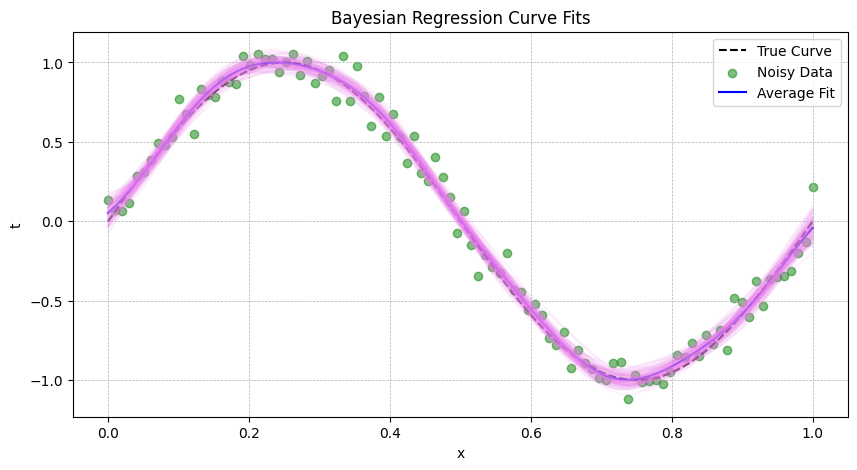

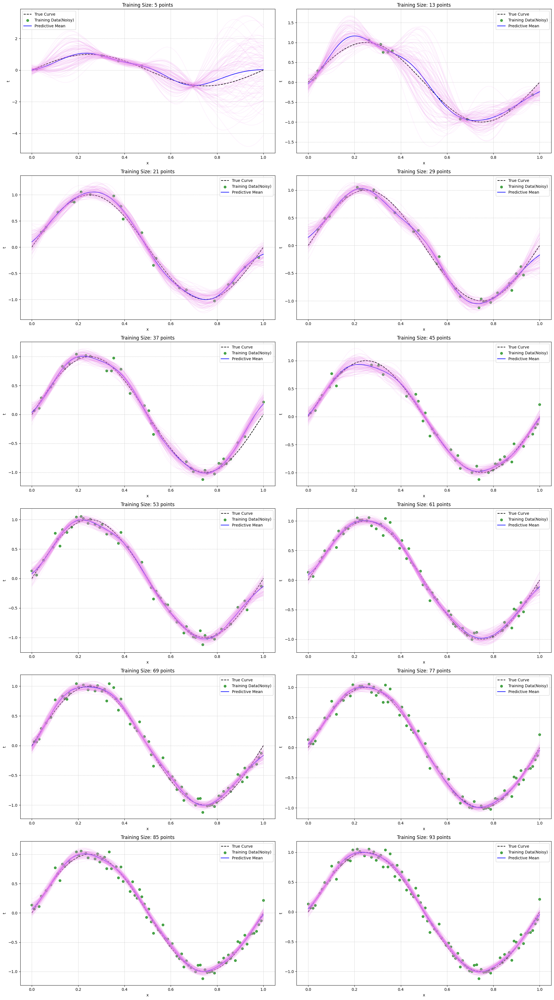

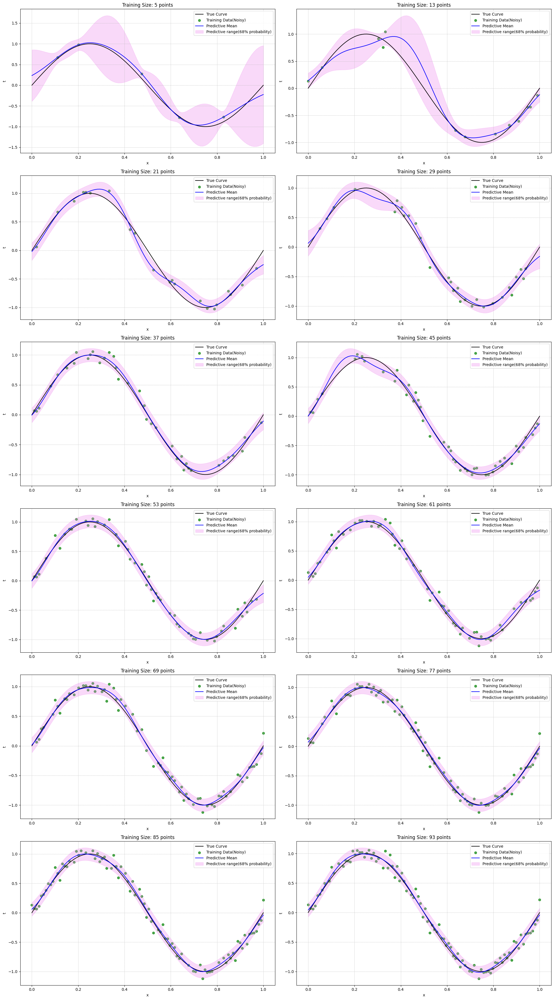

In [8]:
#Understanding MAP estimate
########################################
#Generate 100 data sets of noisy sinusoidal data
########################################

N = 100  # Number of data points
x = np.linspace(0, 1, N)
t_true = np.sin(2 * np.pi * x)  # True function
noise = np.random.normal(0, 0.1, N) # Gaussian noise with noice_std = 0.1
t_noisy = t_true + noise  # Adding Gaussian noise

# Define Gaussian basis functions
def gaussian_basis(x, centers, width):
    return np.exp(-((x[:, None] - centers[None, :]) ** 2) / (2 * (width ** 2)))

########################################
#Update the statistics of posterior density
########################################
#Initialie the parameters for standard normal prior

M = 20  # Number of basis functions
centers = np.linspace(0, 1, M)  # Centers for Gaussian basis functions
phi = gaussian_basis(x, centers, 0.1)    #width of gaussian basis functions be 0.1

alpha = 1.0  # Prior variance $\alpha$
beta = 1 / (0.1 ** 2)  # Noise precision $\beta$
I = np.eye(M)#np.eye(M) = np.identity(M)

# Initialize the parameters for posterior density
m = np.zeros(M)
S = alpha * I

#Iterate through the data points and update the stats of posterior density
for i in range(N):
    phi_i = phi[i].reshape(-1, 1)
    S_inv = np.linalg.inv(S)
    S = np.linalg.inv(S_inv + beta * phi_i @ phi_i.T)
    m = S @ (S_inv @ m + beta * t_noisy[i] * phi_i.flatten())


print("Posterior mean(by bayesian sequential Update): \n", np.array(m), end = '\n\n')
print("Posterior covariance(by bayesian sequential Update): \n", np.matrix(S), end = '\n\n')

########################################
#Sample weight vector from posterior distribution. Estimate the curve, repeat the procedure for 100 times and get the avg fit
########################################

samples = 100    #number of samples
x_test = np.linspace(0, 1, 100)
phi_test = gaussian_basis(x_test, centers, 0.1)
fits = []

for _ in range(samples):
    """
        iterating upto samples iterations but not using the values
        by escaping with blank identifier '_'
    """
    w_sample = np.random.multivariate_normal(m, S)
    fits.append(phi_test @ w_sample)

fits = np.array(fits)
average_fit = np.mean(fits, axis=0)

# Plot sampled fits and average fit
plt.figure(figsize=(10, 5))
plt.plot(x_test, t_true, color = 'black', linestyle = '--', label='True Curve')
plt.scatter(x, t_noisy, color='green', alpha=0.5, label='Noisy Data')
plt.plot(x_test, average_fit, color = 'blue', label='Average Fit')
for fit in fits:
    plt.plot(x_test, fit, alpha=0.09, color = 'violet')
plt.legend()
plt.title("Bayesian Regression Curve Fits")
plt.xlabel('x')
plt.ylabel('t')
plt.grid(axis = 'both', linestyle = '--', linewidth = 0.5)
plt.show()

########################################
#Predictive distribution analysis
########################################
#Predictive distribution analysis through sampling
#Iterate through data points and sample weight vectors when partial data points are seen, and plot the curves

num_train_sizes = range(5, len(x), 8)   #for partial data points
plt.figure(figsize=(20, 36))

for i, num_train in enumerate(num_train_sizes):
    indices = np.random.choice(N, num_train, replace=False)
    x_train = x[indices]
    t_train = t_noisy[indices]
    phi_train = gaussian_basis(x_train, centers, 0.1)

    S_inv = alpha * I + beta * phi_train.T @ phi_train
    S = np.linalg.inv(S_inv)
    m = beta * S @ phi_train.T @ t_train

    pred_samples = []
    for _ in range(samples):
        """
            iterating upto samples iterations but not using the values
            by escaping with blank identifier '_'
        """
        w_sample = np.random.multivariate_normal(m, S)
        pred_samples.append(phi_test @ w_sample)

    pred_samples = np.array(pred_samples)
    pred_mean = np.mean(pred_samples, axis=0)

    plt.subplot(6, 2, i+1)
    plt.plot(x_test, t_true, color = 'black', linestyle = '--', label='True Curve')
    plt.scatter(x_train, t_train, color='green', alpha=0.7, label='Training Data(Noisy)')
    plt.plot(x_test, pred_mean, color = 'blue', label='Predictive Mean')
    for sample in pred_samples:
        plt.plot(x_test, sample, alpha=0.1, color = 'violet')
    plt.title(f"Training Size: {num_train} points")
    plt.xlabel('x')
    plt.ylabel('t')
    plt.legend()
    plt.grid(axis = 'both', linestyle = '--', linewidth = 0.5)

plt.tight_layout()
plt.show()

#Predictive distribution analysis through variance
#Iterate through data points and obtain necessary plots as discussed in the class

pred_means = []
pred_stds = []

plt.figure(figsize=(20, 36))
for i, num_train in enumerate(num_train_sizes):
    indices = np.random.choice(N, num_train, replace=False)
    x_train = x[indices]
    t_train = t_noisy[indices]
    phi_train = gaussian_basis(x_train, centers, 0.1)

    S_inv = alpha * I + beta * phi_train.T @ phi_train
    S = np.linalg.inv(S_inv)
    m = beta * S @ phi_train.T @ t_train

    pred_mean = phi_test @ m
    pred_var = 1 / beta + np.sum(phi_test @ S * phi_test, axis=1)
    pred_means.append(pred_mean)
    pred_stds.append(np.sqrt(pred_var))

    plt.subplot(6, 2, i+1)
    plt.plot(x_test, t_true, color ='black', label='True Curve')
    plt.scatter(x_train, t_train, color='green', alpha=0.7, label='Training Data(Noisy)')
    plt.plot(x_test, pred_mean, color = 'blue', label='Predictive Mean')
    plt.xlabel('x')
    plt.ylabel('t')
    plt.fill_between(x_test, pred_mean - pred_stds[i], pred_mean + pred_stds[i], color='violet', alpha=0.3, label='Predictive range(68% probability)')
    plt.grid(axis = 'both', linestyle = '--', linewidth = 0.5)
    plt.title(f"Training Size: {num_train} points")
    plt.legend()
plt.tight_layout()
plt.show()


**Report your observations**
1. The sampled curve fits show variability, but the average fit closely follows the true function.
2. The predictive distribution narrows as the number of training points increases, showing reduced uncertainty.
3. With fewer training points, the uncertainty is larger, leading to wider confidence intervals.
4. Bayesian sequential updates effectively refine parameter estimates as more data becomes available.